In [4010]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [4011]:
np.random.seed(42)

In [4012]:
N_CLUSTER = 3

In [4013]:
CORRELATION = 0.1

In [4014]:
NOISE_STD = 15

In [4015]:
N_SAMPLE = 10000

In [4016]:
N_FEATURES = 10

In [4017]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[10.0, 5.0, 2.0],
                             separation_factor=4.0,
                             sample_distribution=[4500, 2750, 2750],
                             random_state=42)

In [4018]:
X.shape

(4500, 11)

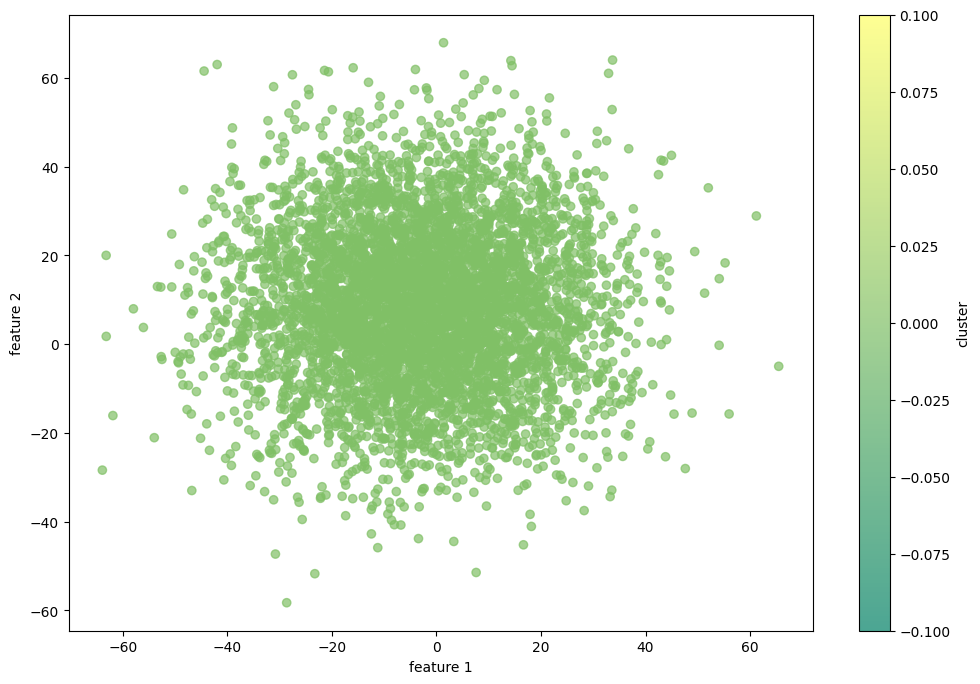

In [4009]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

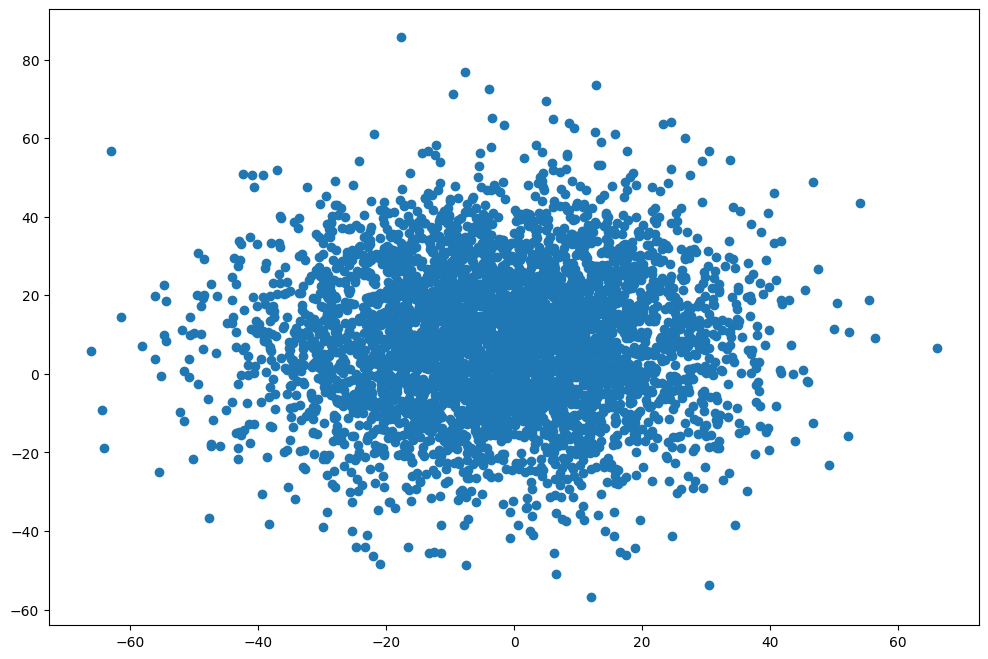

In [3946]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [3947]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [3948]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10
var_1,1.000000,0.018342,-0.019145,-0.001276,-0.001419,0.028365,-0.038923,-0.003372,0.032086,0.033418
var_2,0.018342,1.000000,-0.022951,0.017534,-0.010356,0.005788,-0.015970,0.003486,0.056413,0.023478
var_3,-0.019145,-0.022951,1.000000,-0.012070,0.018032,-0.045916,-0.001427,-0.012021,0.004365,-0.046843
var_4,-0.001276,0.017534,-0.012070,1.000000,0.000030,0.010469,-0.027984,0.003769,0.006164,0.007816
var_5,-0.001419,-0.010356,0.018032,0.000030,1.000000,-0.025914,0.025124,-0.004120,-0.032913,-0.029519
var_6,0.028365,0.005788,-0.045916,0.010469,-0.025914,1.000000,-0.009146,-0.009011,0.043694,0.019181
var_7,-0.038923,-0.015970,-0.001427,-0.027984,0.025124,-0.009146,1.000000,-0.027321,-0.017719,-0.054031
var_8,-0.003372,0.003486,-0.012021,0.003769,-0.004120,-0.009011,-0.027321,1.000000,0.010557,0.014650
var_9,0.032086,0.056413,0.004365,0.006164,-0.032913,0.043694,-0.017719,0.010557,1.000000,0.022515
var_10,0.033418,0.023478,-0.046843,0.007816,-0.029519,0.019181,-0.054031,0.014650,0.022515,1.000000


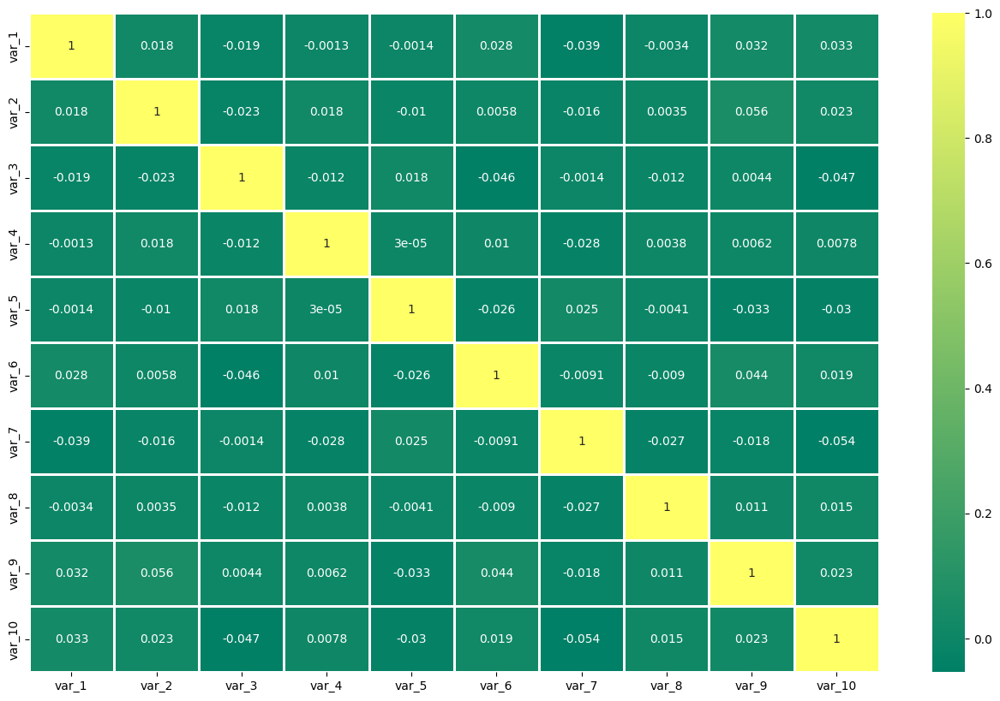

In [3949]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

## data standardization

In [3950]:
X_values = corr_dataset.iloc[:,:-1].values

In [3951]:
y_values = corr_dataset.iloc[:,-1].values

In [3952]:
scaler = StandardScaler()

In [3953]:
X_values = scaler.fit_transform(X_values)

In [3954]:
np.mean(X_values),np.std(X_values)

(3.1579677144893343e-19, 1.0000000000000004)

In [3955]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9
0,0.430774,-0.070327,0.103169,0.046777,-1.012031,0.841083,-0.693284,-1.512385,0.584575,-0.215619
1,-2.310665,0.783398,0.471113,-0.588909,-1.199927,-0.079350,0.154892,-0.464756,-1.386391,0.199086
2,0.449478,-1.366550,-1.636478,1.672140,-1.014657,0.259680,0.138695,-0.246715,1.533665,0.058692
3,2.934824,0.524664,-1.138545,-0.255371,-0.214266,0.188849,0.229496,2.071789,-1.550840,0.079016
4,-0.260037,-1.158014,-0.244267,1.009140,-0.372486,-0.771427,-1.957876,1.169058,0.167615,0.274247
...,...,...,...,...,...,...,...,...,...,...
4495,-0.295465,1.200422,-0.007296,0.127183,1.618349,-0.066373,-0.149933,-0.692075,-1.990489,0.694769
4496,0.259387,0.856118,0.688833,-0.661707,-0.505776,-0.942377,-0.906485,0.820051,0.729231,0.575360
4497,0.359076,2.635731,-1.896668,0.283414,-0.466596,-0.191930,0.684666,-0.707232,-1.212997,-0.524768
4498,-1.459890,-1.418916,1.551610,1.074864,-0.542347,-0.907783,-0.527736,-1.837379,1.172652,-0.179602


# dimensionality reduction algorithms

## pca 

In [3956]:
pca_general = PCA()

In [3957]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [3958]:
explained_variance = pca_general.explained_variance_ratio_

In [3959]:
explained_variance

array([0.11833015, 0.10347799, 0.10243729, 0.10055395, 0.1003072 ,
       0.09931006, 0.09792119, 0.0941946 , 0.09297502, 0.09049256])

In [3960]:
eigenvalues = pca_general.explained_variance_

In [3961]:
eigenvalues

array([1.18356447, 1.03500989, 1.02460058, 1.00576298, 1.00329493,
       0.99332132, 0.97942953, 0.9421554 , 0.92995689, 0.90512673])

In [3962]:
eigenvalues[1]

1.03500988730991

In [3963]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[1.1835644703995232, 1.03500988730991, 1.0246005781274474, 1.0057629760942255, 1.0032949344071203]


In [3964]:
N_COMPONENTS = len(selected_components)

In [3965]:
eigenvectors = pca_general.components_

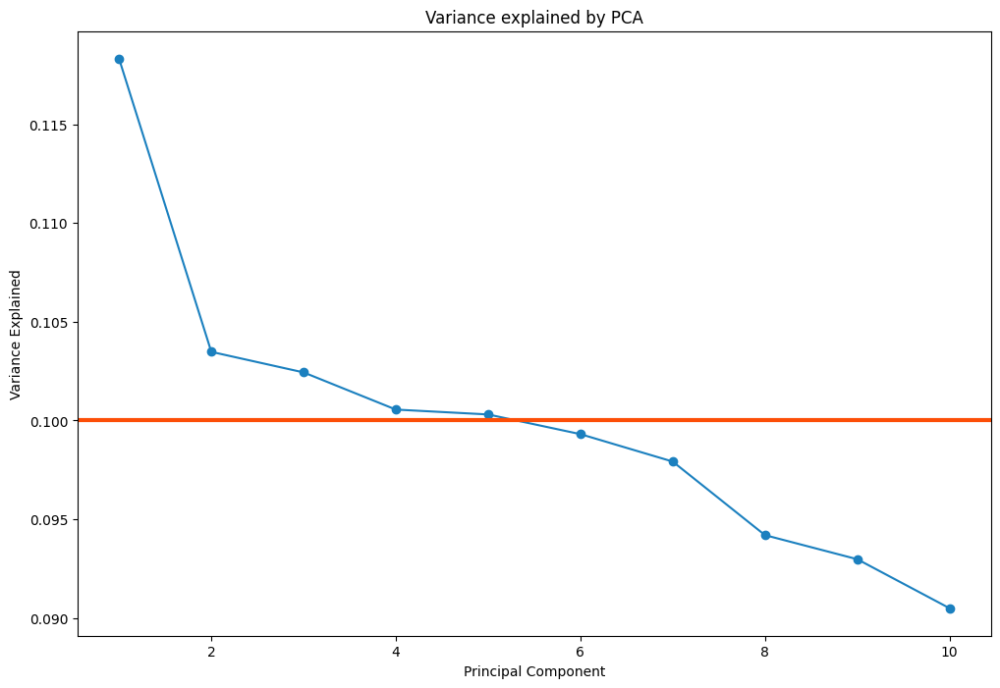

In [3966]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [3967]:
pca = PCA(n_components=N_COMPONENTS)

In [3968]:
X_pca = pca.fit_transform(X_values)

In [3969]:
pd.DataFrame(X_pca).head(8)

,0,1,2,3,4
0,0.864103,1.055261,0.328152,-0.528029,0.374347
1,-0.997323,0.049585,-0.297375,0.261843,-1.815332
2,1.380408,0.623178,-0.787785,0.770501,-0.259171
3,1.198517,-0.763317,-1.369186,-0.586260,0.835239
4,0.649992,-2.295713,-0.450117,0.032980,-0.397391
5,0.758729,-0.508427,-1.221003,1.137214,1.205736
6,-0.875057,0.816102,-0.914585,-0.014501,1.879769
7,-0.201643,1.101646,0.836074,0.965798,-0.141062


In [3970]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [3971]:
pca_data = pd.DataFrame(X_pca, columns=pca_columns)

In [3972]:
pca_data = pd.concat([pca_data, corr_dataset[['target']]], axis=1)

In [3973]:
pca_data

,dim_1,dim_2,dim_3,dim_4,dim_5,target
0,0.864103,1.055261,0.328152,-0.528029,0.374347,0
1,-0.997323,0.049585,-0.297375,0.261843,-1.815332,0
2,1.380408,0.623178,-0.787785,0.770501,-0.259171,0
3,1.198517,-0.763317,-1.369186,-0.586260,0.835239,0
4,0.649992,-2.295713,-0.450117,0.032980,-0.397391,0
...,...,...,...,...,...,...
4495,-0.672458,-0.474386,-0.670401,0.990107,1.418095,0
4496,0.828646,-1.168496,1.216996,-0.886113,-0.540840,0
4497,0.631650,1.082748,-0.439536,1.691651,0.145790,0
4498,-1.061994,-0.174687,1.246803,0.057892,-0.198819,0


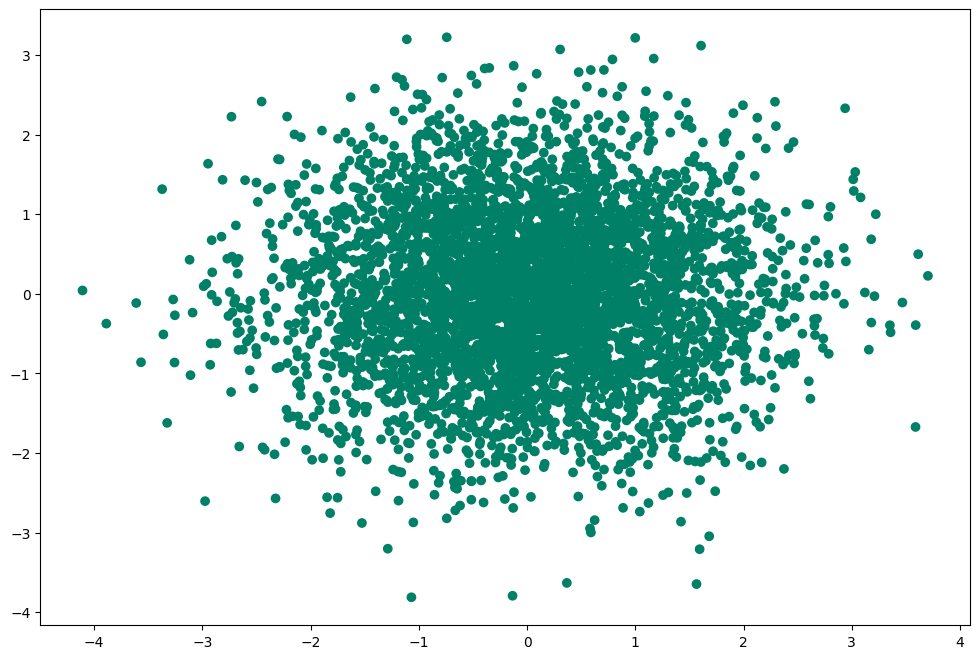

In [3974]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=pca_data['dim_1'],y=pca_data['dim_2'],c=pca_data['target'],cmap='summer')
plt.show()

## t-SNE

In [3975]:
tsne = TSNE(n_components=3,random_state=42)

In [3976]:
X_tsne = tsne.fit_transform(X_values)

KeyboardInterrupt: 

In [ ]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-8.628294,7.808095,-17.359402,0
1,15.208339,1.495749,-21.195518,6
2,-17.241529,-10.433073,9.249471,3
3,20.940390,-5.644534,-1.472649,0
4,17.246429,5.892450,10.020817,2
...,...,...,...,...
4995,7.955318,21.134972,16.784889,0
4996,-1.473532,-8.297864,15.695453,2
4997,14.902334,-10.097699,-2.072990,0
4998,-0.944449,12.170572,8.081478,1


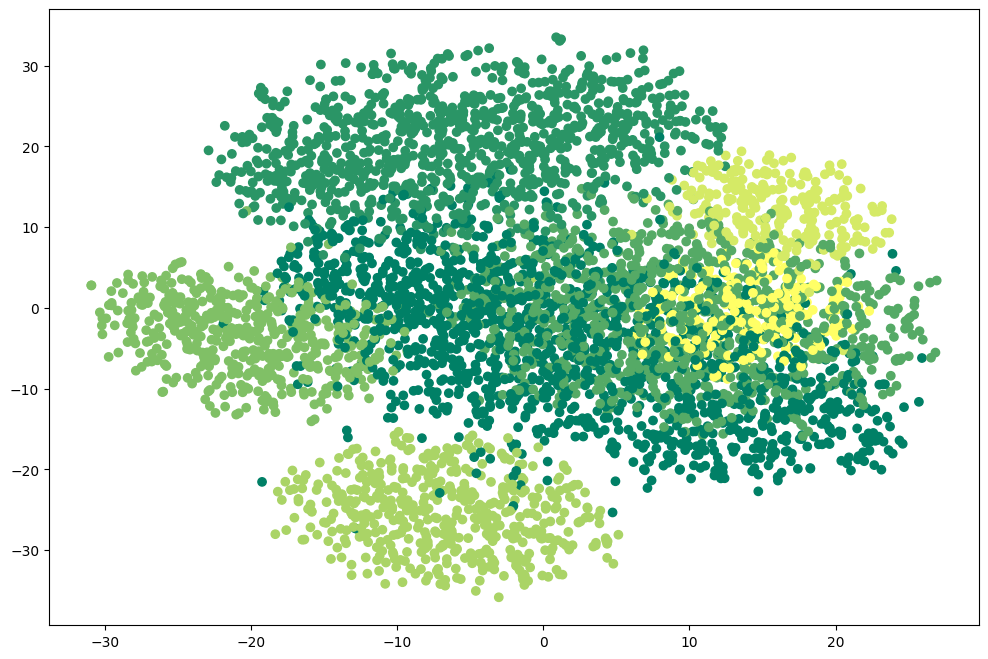

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'],cmap='summer')
plt.show()

In [ ]:
tsne.kl_divergence_

1.9811214208602905

## umap

In [ ]:
umap = umap.UMAP(n_components=3,random_state=42)

In [ ]:
X_umap = umap.fit_transform(X_values)

In [ ]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
umap_data

,dim_1,dim_2,dim_3,target
0,7.498109,2.366695,6.055690,0
1,9.870120,1.082870,11.545732,6
2,3.944391,1.918456,0.987009,3
3,8.804780,5.620936,5.358061,0
4,7.885648,9.531019,5.081350,2
...,...,...,...,...
4995,9.206666,5.387387,5.108935,0
4996,7.167992,9.998219,5.018424,2
4997,8.797551,5.455379,5.526944,0
4998,-0.403185,6.128823,7.186145,1


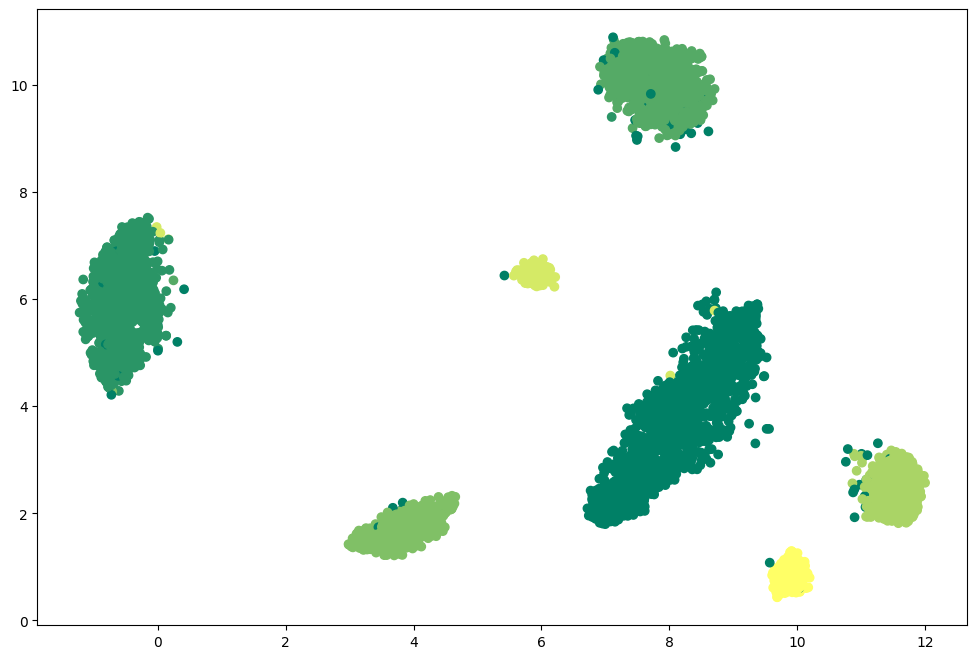

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'],cmap='summer')
plt.show()

# clustering algorithms

## k-means 

In [ ]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans.fit(X_values)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_kmeans = corr_dataset.copy()

In [ ]:
df_kmeans['k_means'] = kmeans.labels_

In [ ]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,k_means
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,2
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,4
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,1
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,1
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,3
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,1
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,5


In [ ]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.1484
accuracy after: 0.7932


In [ ]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,k_means
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


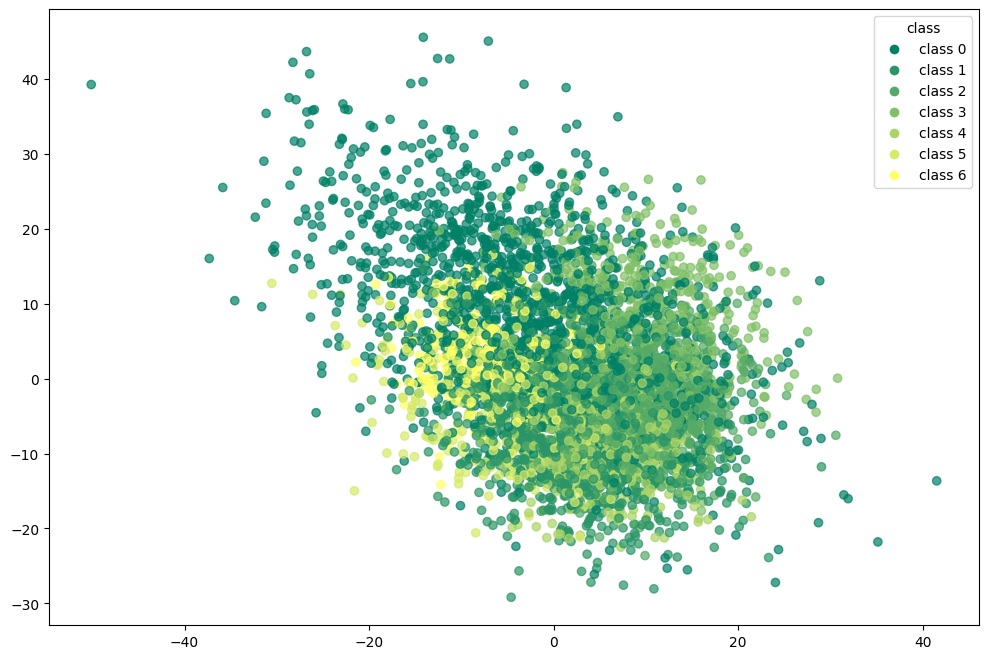

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

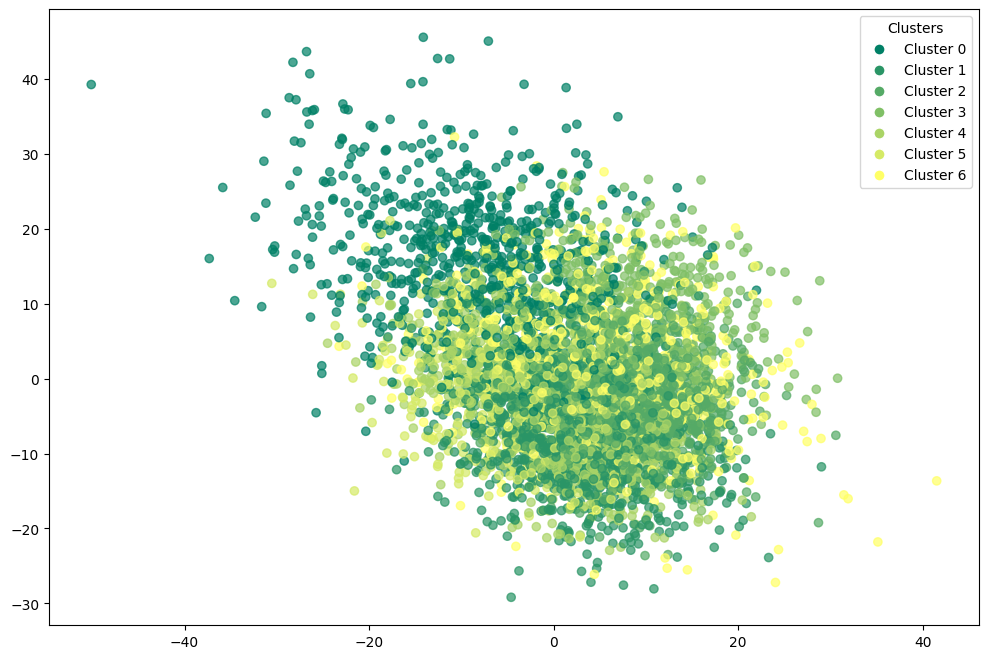

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
kmeans.cluster_centers_

array([[-1.09986175,  1.37857771,  0.72659238,  0.35270504, -0.95121157,
        -1.27862493, -0.12425547,  1.39271448,  0.11076587,  0.13644193,
         0.03622349,  0.60166002,  1.31013547, -0.08856922,  0.35649274,
        -0.39060925, -1.12322799, -0.52665056,  0.16817582, -0.18123464],
       [ 0.22564721,  0.14468648, -0.10647448, -0.16961196,  0.30193686,
         0.10403449, -1.3686968 ,  0.13198779, -0.06810078,  0.82287999,
        -1.42371865,  1.14057804, -0.25411464, -1.05220126, -1.09377757,
        -0.92588932,  0.36491577,  0.66563252, -0.92403504, -0.50110644],
       [-0.15844187, -0.42137738,  0.61122361, -0.25327907,  0.72340543,
        -0.25775633,  0.19108301, -0.10558489,  0.77613312,  0.56852087,
         0.22072092, -0.69725445,  0.31787767, -0.35193473, -0.40256623,
        -0.19991619,  0.72528398, -0.46379578, -0.72125586,  0.87879397],
       [ 0.68984074, -0.34103233,  0.08079763,  0.76964199, -0.45951593,
         0.84076913,  0.5004571 , -0.70840038, -

In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[ 741   15   19   13   72   10  630]
 [   2  987    7    0    1    2    1]
 [   0    0 1000    0    0    0    0]
 [   1    0    0  494    4    0    1]
 [   1    0    0    0  499    0    0]
 [   0    0    2    0    0  245    3]
 [   0    0    0    0  250    0    0]]


In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66      1500
           1       0.99      0.99      0.99      1000
           2       0.97      1.00      0.99      1000
           3       0.97      0.99      0.98       500
           4       0.60      1.00      0.75       500
           5       0.95      0.98      0.97       250
           6       0.00      0.00      0.00       250

    accuracy                           0.79      5000
   macro avg       0.78      0.78      0.76      5000
weighted avg       0.90      0.79      0.81      5000



In [ ]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.7520559440302462

In [ ]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.8422703455077782

In [ ]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.19083652620540836

### k-means with pca

In [ ]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_pca.fit(X_pca)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_pca_kmeans = corr_dataset.copy()

In [ ]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [ ]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,3
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,1
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,5


In [ ]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.298
accuracy after: 0.7198


In [ ]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,5
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[ 626   15   27   11   43  379  399]
 [   0  975    9    1    3   10    2]
 [   0    0 1000    0    0    0    0]
 [   0    0    1  485    7    7    0]
 [   1    0    0    0  499    0    0]
 [  17  102   62    5   46   14    4]
 [   0    0    0    0  250    0    0]]


In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.97      0.42      0.58      1500
           1       0.89      0.97      0.93      1000
           2       0.91      1.00      0.95      1000
           3       0.97      0.97      0.97       500
           4       0.59      1.00      0.74       500
           5       0.03      0.06      0.04       250
           6       0.00      0.00      0.00       250

    accuracy                           0.72      5000
   macro avg       0.62      0.63      0.60      5000
weighted avg       0.81      0.72      0.73      5000



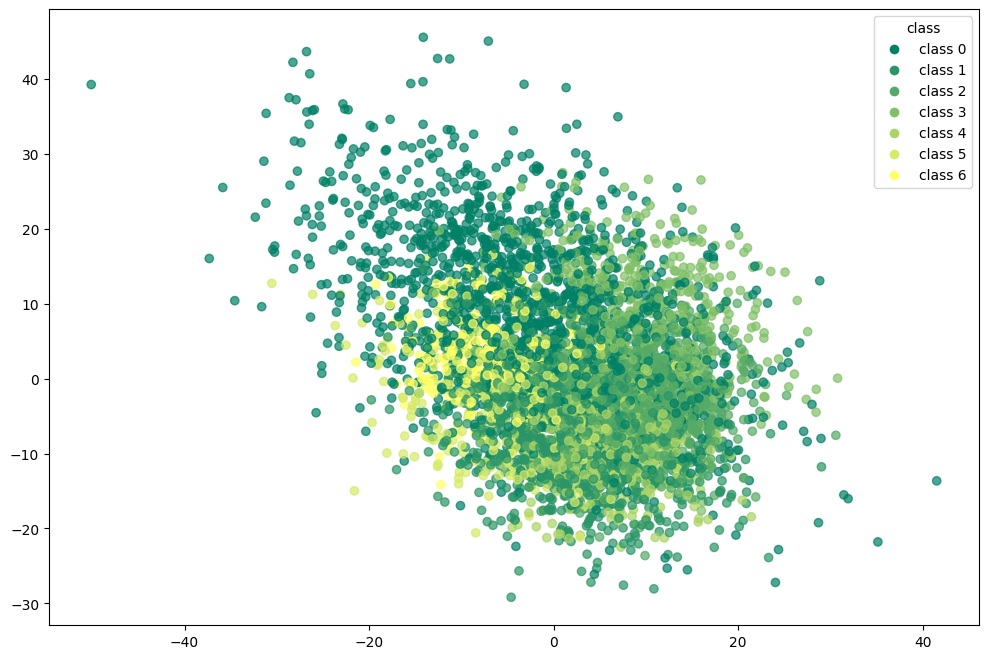

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

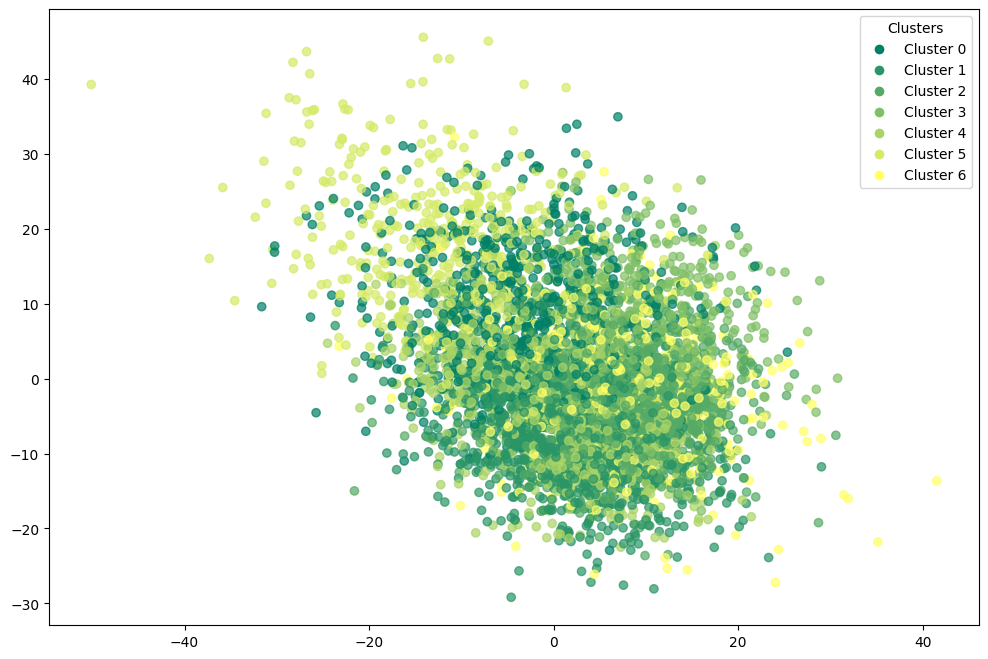

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.651932296094861

In [ ]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.7429747052454804

In [ ]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.18129300511411817

### k-means with t-SNE

In [ ]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_tsne.fit(X_tsne)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_tsne_kmeans = corr_dataset.copy()

In [ ]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [ ]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,6
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,1
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,3
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,1
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,4


In [ ]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.327
accuracy after: 0.7734


In [ ]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,6
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,5
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


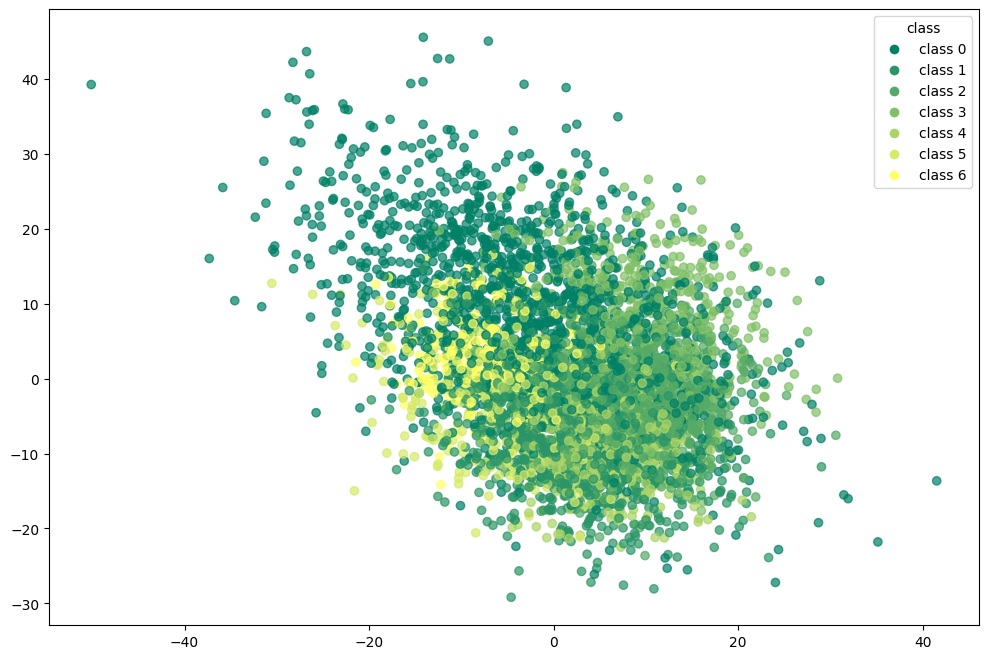

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

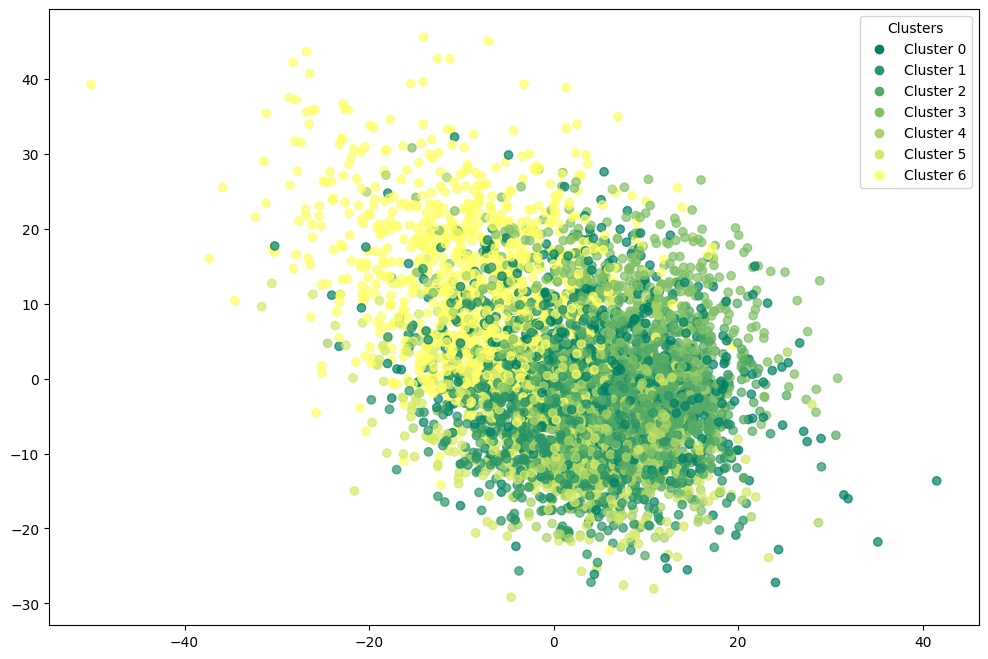

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[586  16  14  97  65  33 689]
 [  0 841   2   7   0 150   0]
 [ 26   1 946   0   0  27   0]
 [  0   1   0 499   0   0   0]
 [  0   0   0   0 499   0   1]
 [  1   0   1   0   0 248   0]
 [  2   0   0   0   0   0 248]]


In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.95      0.39      0.55      1500
           1       0.98      0.84      0.90      1000
           2       0.98      0.95      0.96      1000
           3       0.83      1.00      0.90       500
           4       0.88      1.00      0.94       500
           5       0.54      0.99      0.70       250
           6       0.26      0.99      0.42       250

    accuracy                           0.77      5000
   macro avg       0.78      0.88      0.77      5000
weighted avg       0.89      0.77      0.78      5000



In [ ]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.6485355769951834

In [ ]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.7582581082745493

In [ ]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.14430840992788377

### k-means with umap

In [ ]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_umap.fit(X_umap)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_umap_kmeans = corr_dataset.copy()

In [ ]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [ ]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,2
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,3
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.5366
accuracy after: 0.9844


In [ ]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


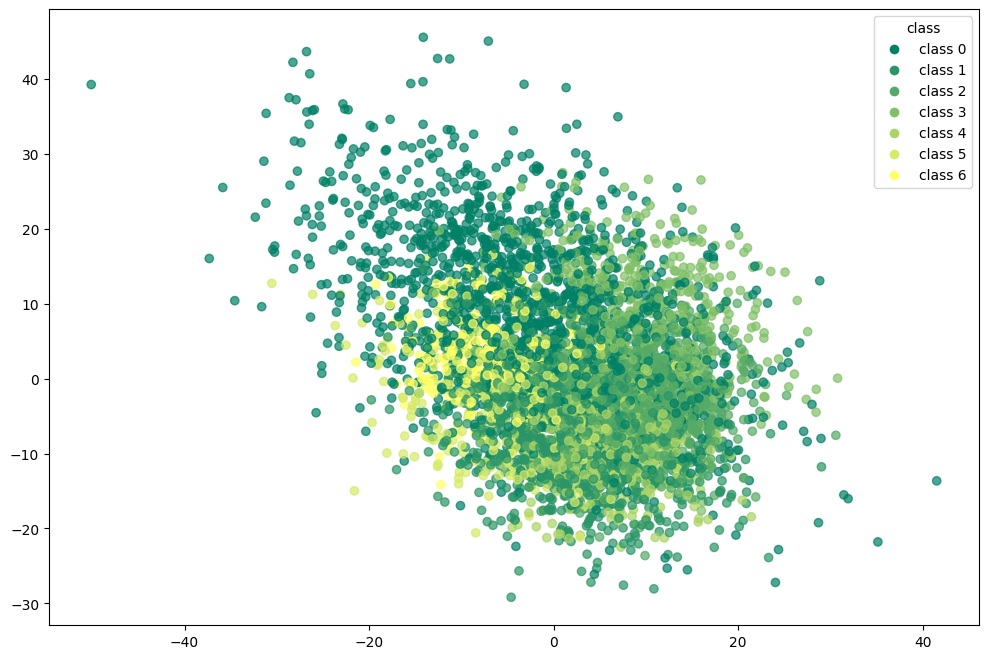

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

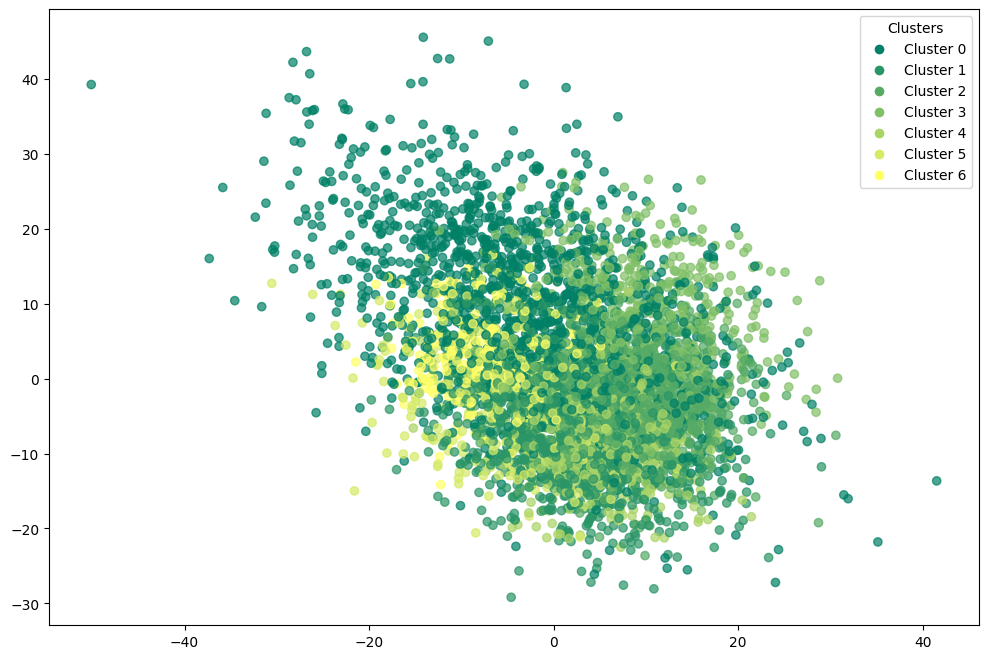

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9572453282340698

In [ ]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9514378802180793

In [ ]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.16585441023027375

## Birch

In [ ]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_birch = corr_dataset.copy()

In [ ]:
df_birch['birch'] = birch.labels_

In [ ]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,3
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,5
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,2
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,2
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,4
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,2
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.1986
accuracy after: 0.7354


In [ ]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,6
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,5
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,5
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,5
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


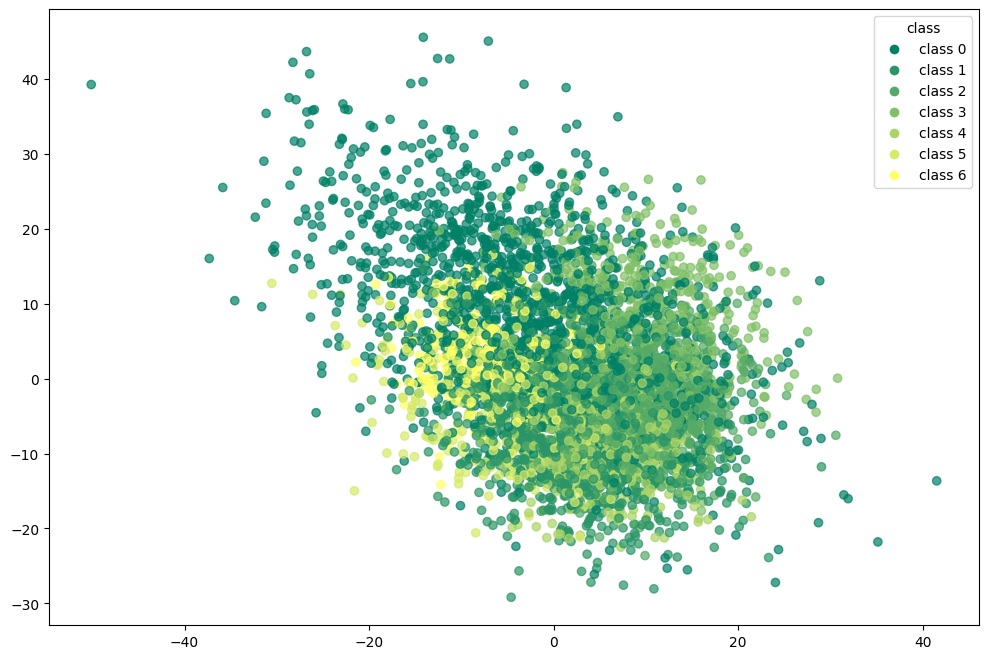

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

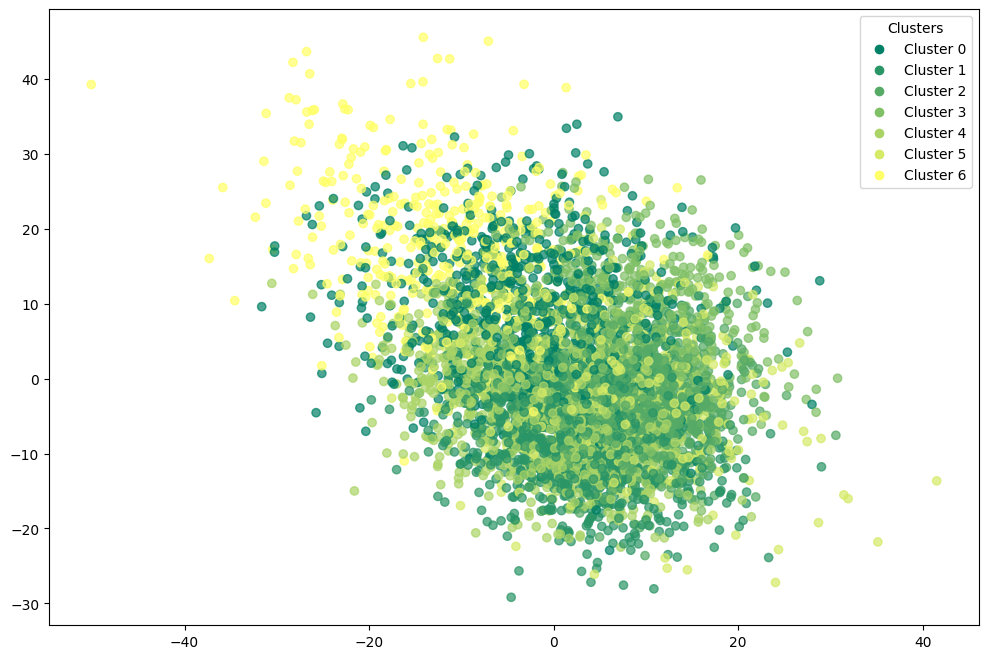

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[691   4   1   2   2 410 390]
 [  3 989   3   2   1   0   2]
 [  0   2 998   0   0   0   0]
 [  0   1   0 499   0   0   0]
 [  1   0   1   0 498   0   0]
 [  2   2   0   0 244   2   0]
 [  1   0   0   0 248   1   0]]


In [ ]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.99      0.46      0.63      1500
           1       0.99      0.99      0.99      1000
           2       1.00      1.00      1.00      1000
           3       0.99      1.00      1.00       500
           4       0.50      1.00      0.67       500
           5       0.00      0.01      0.01       250
           6       0.00      0.00      0.00       250

    accuracy                           0.74      5000
   macro avg       0.64      0.64      0.61      5000
weighted avg       0.84      0.74      0.75      5000



In [ ]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.7074145681081484

In [ ]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.8315630869250168

In [ ]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.1723657973664695

### Birch with pca

In [ ]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_pca_birch = corr_dataset.copy()

In [ ]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [ ]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,3
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,2
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,5
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,5
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,0
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,5
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,2


In [ ]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.007
accuracy after: 0.469


In [ ]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,4
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,2
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,1
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,5
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,5
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,5
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[651   8  18  78 437 293  15]
 [  8 705 271   0  14   2   0]
 [ 13   4 982   0   1   0   0]
 [ 16 468  15   0   1   0   0]
 [ 17   1 479   0   3   0   0]
 [  0   2 244   0   0   4   0]
 [  1   0 245   0   0   4   0]]


In [ ]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.92      0.43      0.59      1500
           1       0.59      0.70      0.64      1000
           2       0.44      0.98      0.60      1000
           3       0.00      0.00      0.00       500
           4       0.01      0.01      0.01       500
           5       0.01      0.02      0.01       250
           6       0.00      0.00      0.00       250

    accuracy                           0.47      5000
   macro avg       0.28      0.31      0.27      5000
weighted avg       0.48      0.47      0.43      5000



In [ ]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.29737129160407205

In [ ]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.515249836296794

In [ ]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.1056111012435908

### Birch with t-SNE

In [ ]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_tsne_birch = corr_dataset.copy()

In [ ]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [ ]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,5
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,1
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.59
accuracy after: 0.8144


In [ ]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,5
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,1
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,5
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


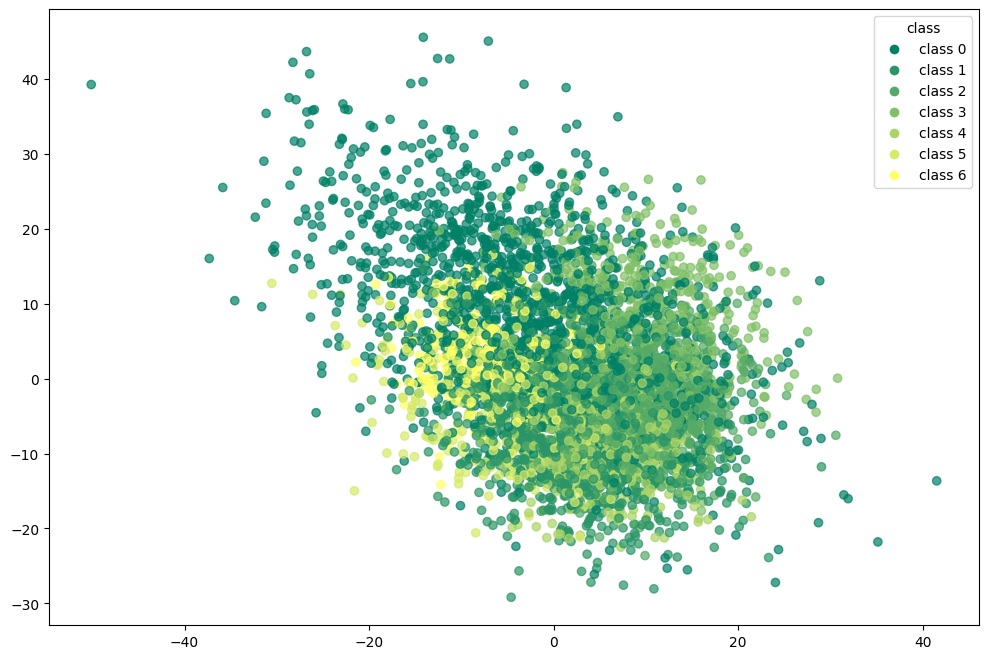

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

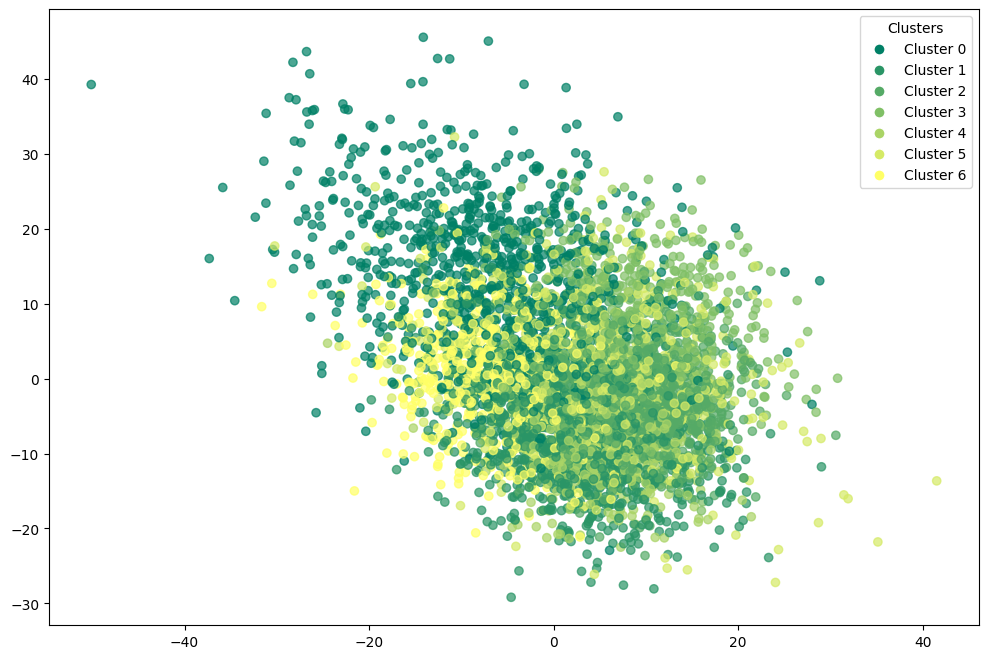

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[890  13  48   8  16 506  19]
 [ 17 980   2   0   0   0   1]
 [  0   2 996   0   0   2   0]
 [  1   3   0 496   0   0   0]
 [  2   0   0   0 458  40   0]
 [  1   4   1   0   0   2 242]
 [  0   0   0   0   0   0 250]]


In [ ]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.98      0.59      0.74      1500
           1       0.98      0.98      0.98      1000
           2       0.95      1.00      0.97      1000
           3       0.98      0.99      0.99       500
           4       0.97      0.92      0.94       500
           5       0.00      0.01      0.01       250
           6       0.49      1.00      0.66       250

    accuracy                           0.81      5000
   macro avg       0.76      0.78      0.75      5000
weighted avg       0.90      0.81      0.84      5000



In [ ]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.7691327953283424

In [ ]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.8374730532640597

In [ ]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.1705465487387227

### Birch with umap

In [ ]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_umap_birch = corr_dataset.copy()

In [ ]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [ ]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,5
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,4
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.586
accuracy after: 0.9844


In [ ]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


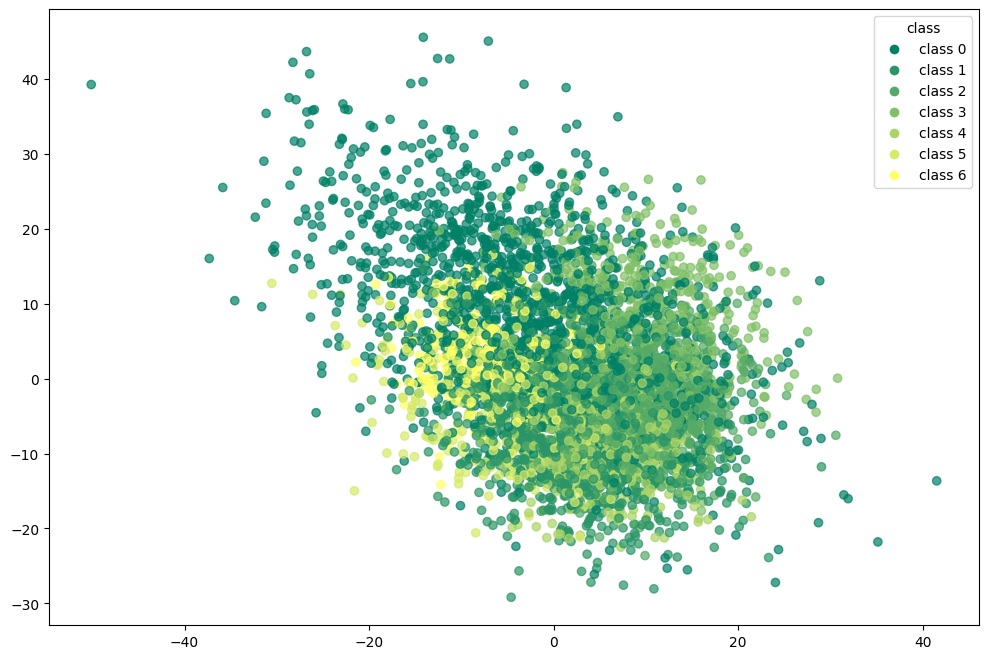

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

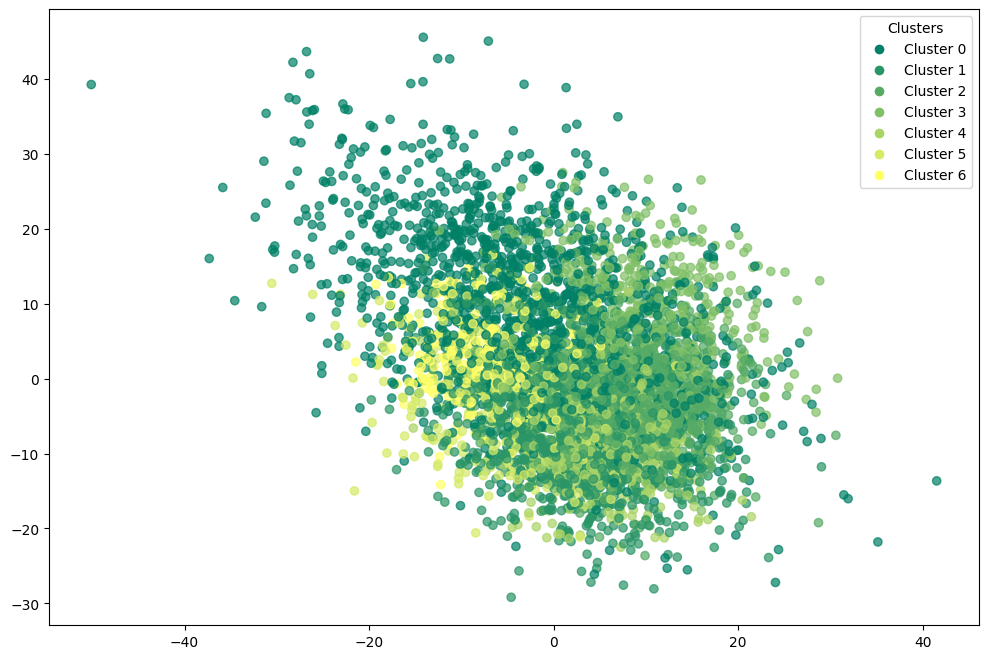

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9572453282340698

In [ ]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9514378802180793

In [ ]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.16585441023027375

## GMM - Gaussian Mixture Models

In [ ]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm.fit(X_values)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_gmm = corr_dataset.copy()

In [ ]:
df_gmm['gmm'] = gmm.predict(X_values)

In [ ]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,2
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,4
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,3
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,5


In [ ]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.2998
accuracy after: 0.9122


In [ ]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


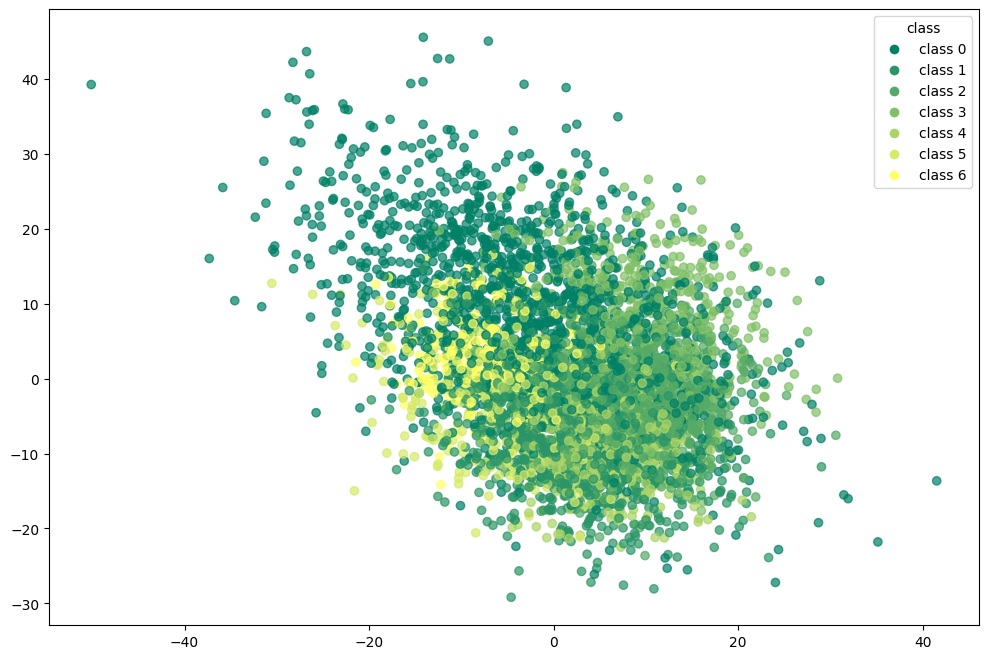

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

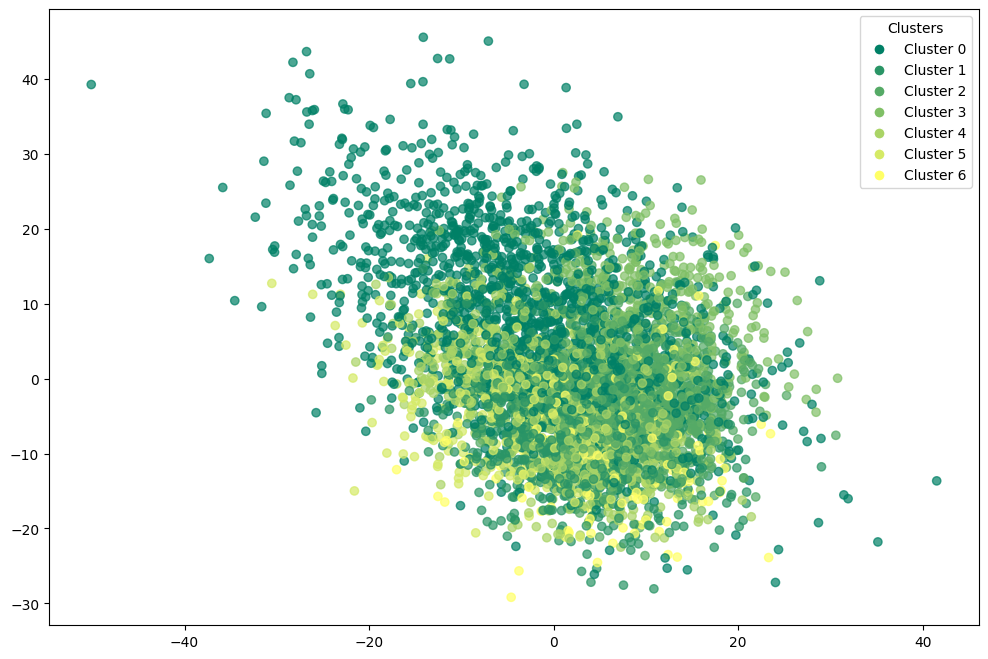

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1499    0    0    0    0    0    1]
 [   2  833    0    0    0    0  165]
 [   0    0 1000    0    0    0    0]
 [   1    0    0  483    0    0   16]
 [   2    0    0    0  498    0    0]
 [   0    0    0    0    0  248    2]
 [   0    0    0    0  250    0    0]]


In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      0.83      0.91      1000
           2       1.00      1.00      1.00      1000
           3       1.00      0.97      0.98       500
           4       0.67      1.00      0.80       500
           5       1.00      0.99      1.00       250
           6       0.00      0.00      0.00       250

    accuracy                           0.91      5000
   macro avg       0.81      0.83      0.81      5000
weighted avg       0.92      0.91      0.91      5000



In [ ]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.9269249713910761

In [ ]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.9342499461017657

In [ ]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.12452911732432835

### GMM with pca

In [ ]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_pca.fit(X_pca)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_pca_gmm = corr_dataset.copy()

In [ ]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [ ]:
df_pca_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,3
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,1
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,5


In [ ]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.337
accuracy after: 0.7388


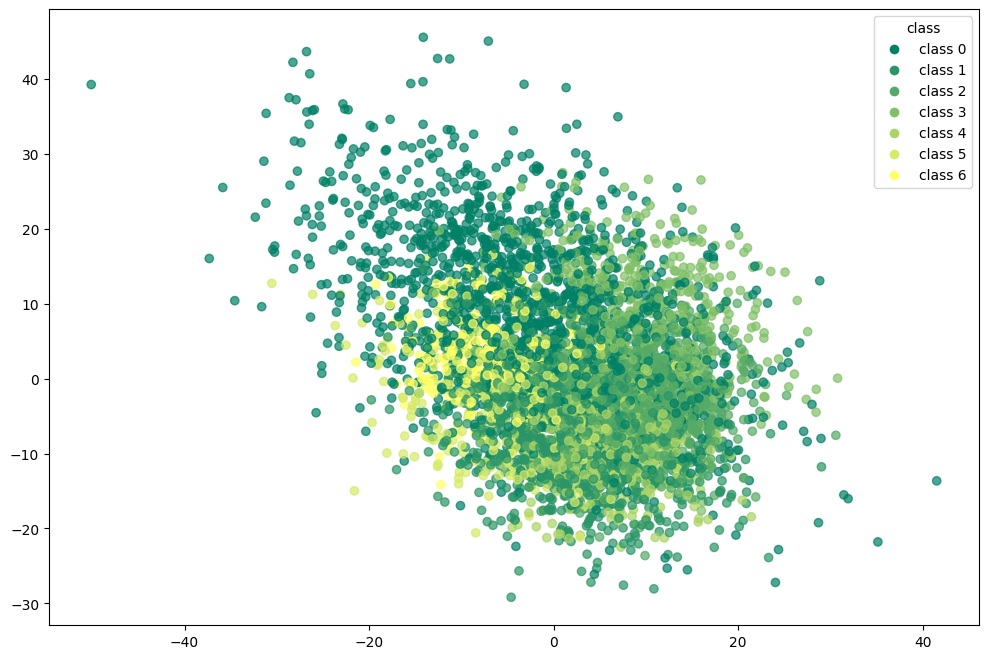

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

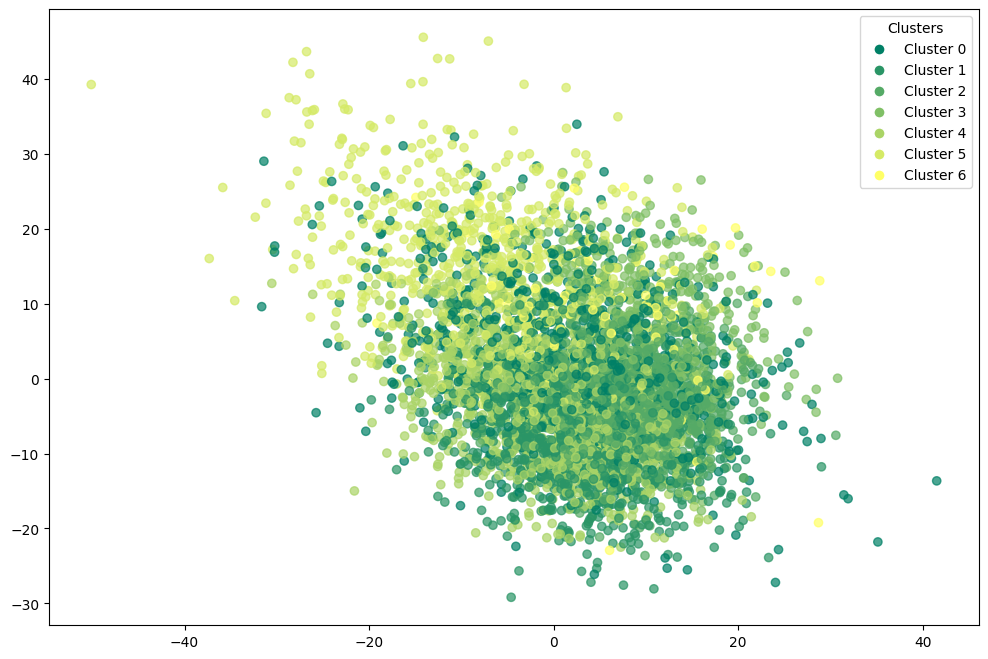

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[740   7   3   1  15 685  49]
 [  0 991   1   0   7   1   0]
 [  0   1 997   0   2   0   0]
 [  0   1   0 468   0   0  31]
 [  1   0   0   0 498   1   0]
 [  4   3   0   0 243   0   0]
 [  0   0   0   0 250   0   0]]


In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66      1500
           1       0.99      0.99      0.99      1000
           2       1.00      1.00      1.00      1000
           3       1.00      0.94      0.97       500
           4       0.49      1.00      0.66       500
           5       0.00      0.00      0.00       250
           6       0.00      0.00      0.00       250

    accuracy                           0.74      5000
   macro avg       0.64      0.63      0.61      5000
weighted avg       0.84      0.74      0.76      5000



In [ ]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.7333565924163273

In [ ]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.8327593854785285

In [ ]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.15764603492415144

### GMM with t-SNE

In [ ]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_tsne.fit(X_tsne)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_tsne_gmm = corr_dataset.copy()

In [ ]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [ ]:
df_tsne_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,1
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,6
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,1
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,4
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,1
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,4


In [ ]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.2392
accuracy after: 0.9408


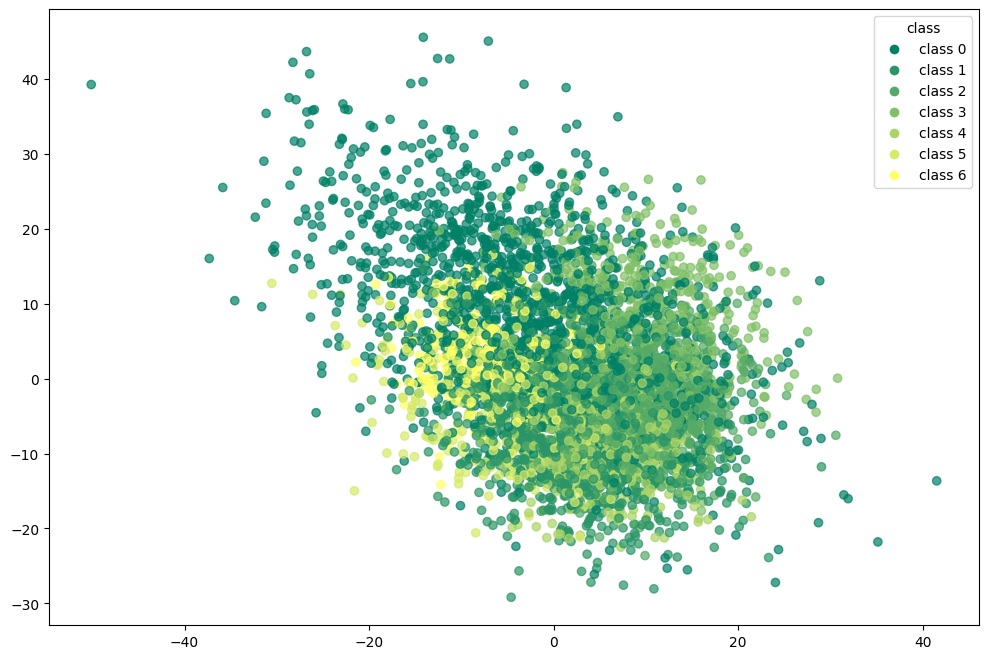

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

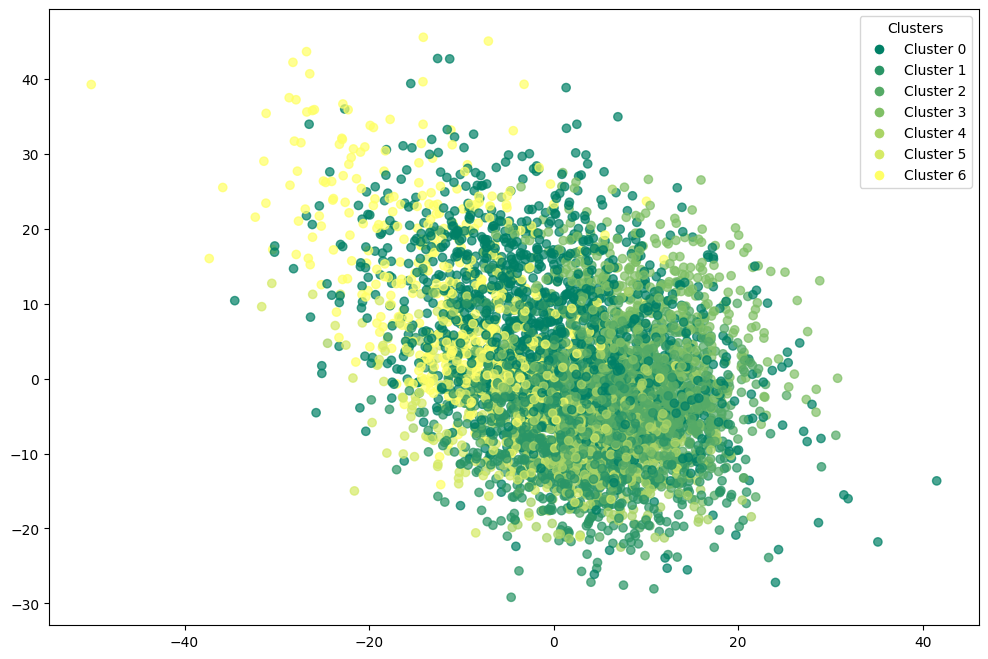

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1227   17   26    7   19    3  201]
 [   1  996    2    0    0    1    0]
 [   4    2  994    0    0    0    0]
 [   0    2    0  498    0    0    0]
 [   3    0    0    0  497    0    0]
 [   3    4    1    0    0  242    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.99      0.82      0.90      1500
           1       0.98      1.00      0.99      1000
           2       0.97      0.99      0.98      1000
           3       0.99      1.00      0.99       500
           4       0.96      0.99      0.98       500
           5       0.98      0.97      0.98       250
           6       0.55      1.00      0.71       250

    accuracy                           0.94      5000
   macro avg       0.92      0.97      0.93      5000
weighted avg       0.96      0.94      0.94      5000



In [ ]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.8683526799677898

In [ ]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.8925281785639404

In [ ]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.1586182491758622

### GMM with umap

In [ ]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_umap.fit(X_umap)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_umap_gmm = corr_dataset.copy()

In [ ]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [ ]:
df_umap_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,2
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,3
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.5366
accuracy after: 0.9844


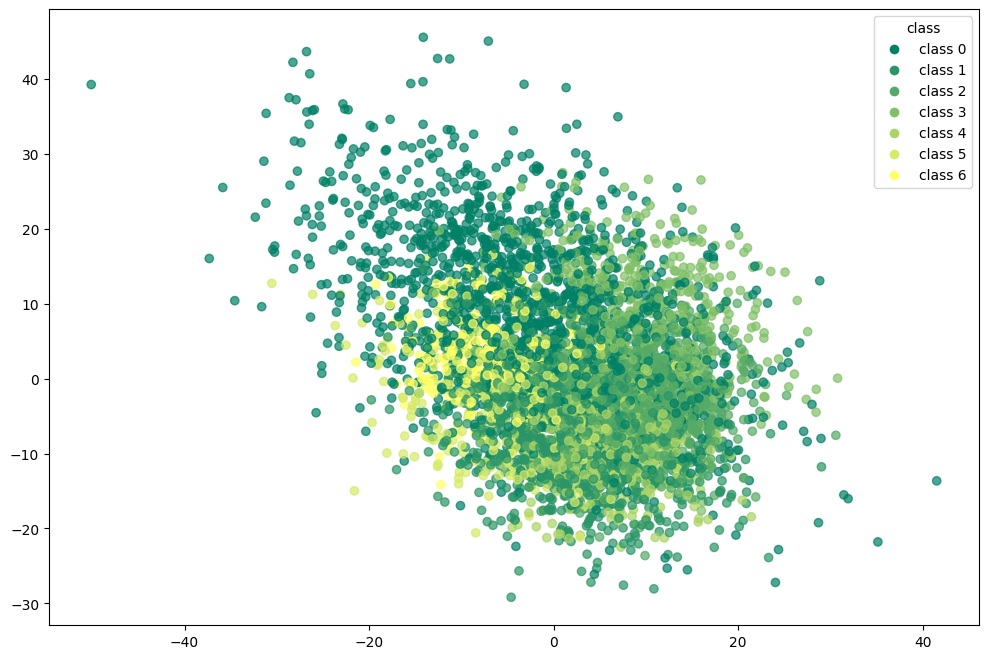

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

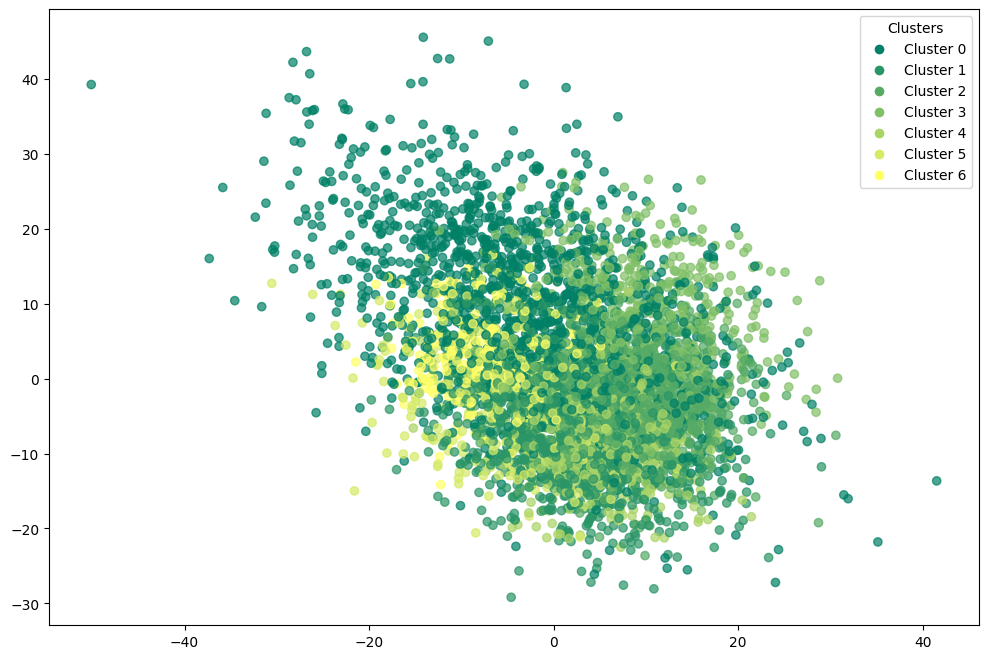

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9572453282340698

In [ ]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9514378802180793

In [ ]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.16585441023027375

## pam

In [ ]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [ ]:
pam.process()

In [ ]:
clusters = pam.get_clusters()

In [ ]:
medoids = pam.get_medoids()

In [ ]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam = corr_dataset.copy()

In [ ]:
df_pam['pam'] = labels

In [ ]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,3.0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4.0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,0.0
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6.0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6.0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2.0
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6.0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1.0


In [ ]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.425
accuracy after: 0.745


In [ ]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,5
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


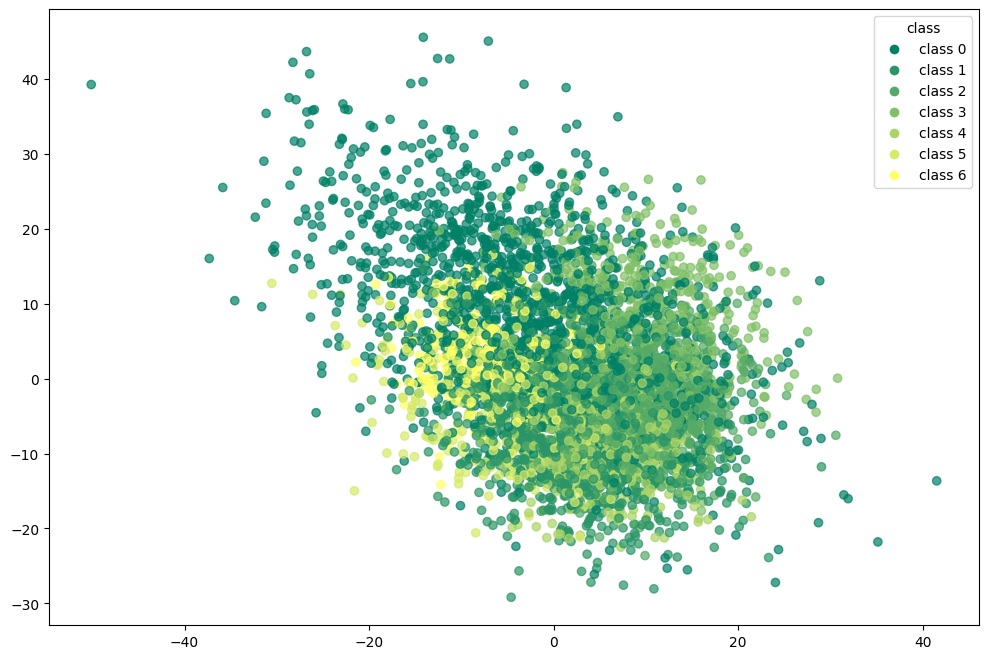

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

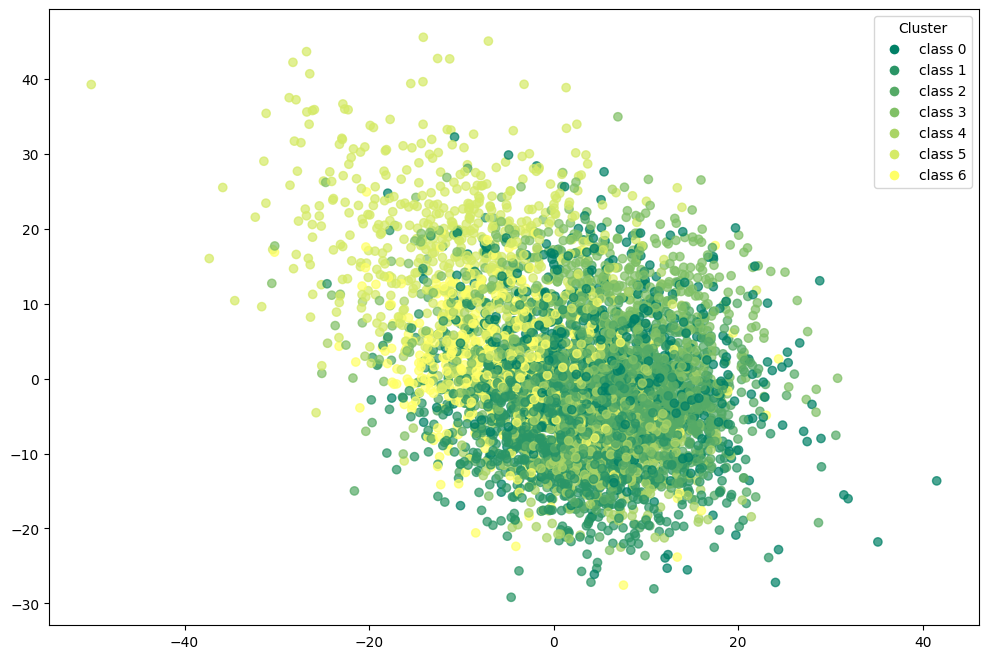

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[543  31  71 147  65 541 102]
 [  3 965  14   5   0   6   7]
 [  0   0 999   0   0   0   1]
 [  2  13   5 465   1   0  14]
 [  0   0   0   0 500   0   0]
 [  3  49  48  53  14   3  80]
 [  0   0   0   0   0   0 250]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.99      0.36      0.53      1500
           1       0.91      0.96      0.94      1000
           2       0.88      1.00      0.93      1000
           3       0.69      0.93      0.79       500
           4       0.86      1.00      0.93       500
           5       0.01      0.01      0.01       250
           6       0.55      1.00      0.71       250

    accuracy                           0.74      5000
   macro avg       0.70      0.75      0.69      5000
weighted avg       0.84      0.74      0.74      5000



In [ ]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.6336500210019922

In [ ]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.7006480520465838

In [ ]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.174314765159987

### pam with pca

In [ ]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [ ]:
pam_pca.process()

In [ ]:
clusters = pam_pca.get_clusters()

In [ ]:
medoids = pam_pca.get_medoids()

In [ ]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_pca = corr_dataset.copy()

In [ ]:
df_pam_pca['pam_pca'] = labels

In [ ]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,6.0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0.0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,4.0
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,1.0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,1.0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2.0
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,1.0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,3.0


In [ ]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.2598
accuracy after: 0.788


In [ ]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,6
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


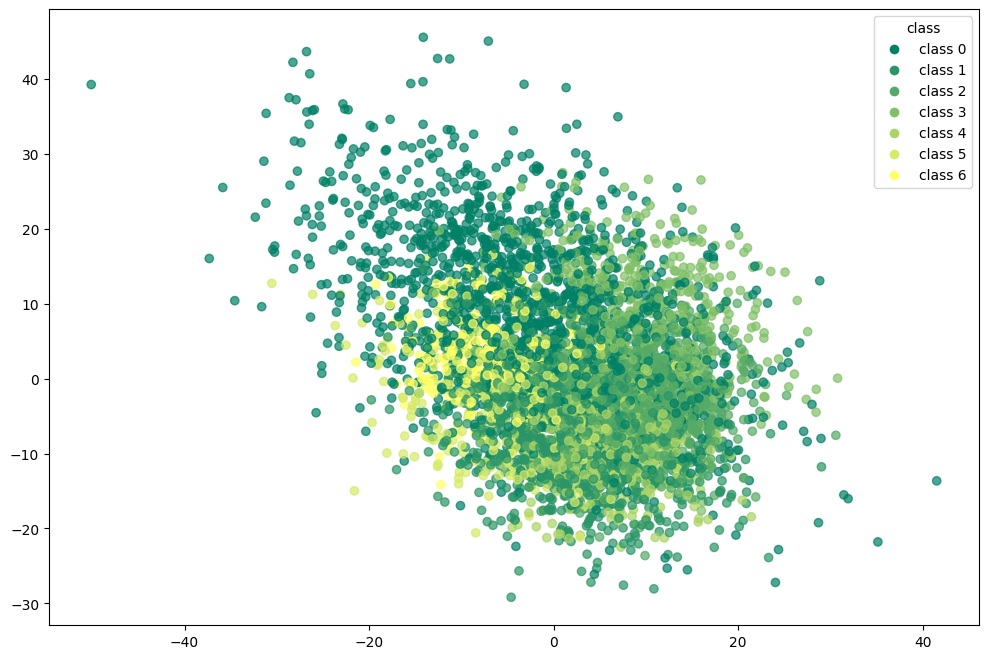

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

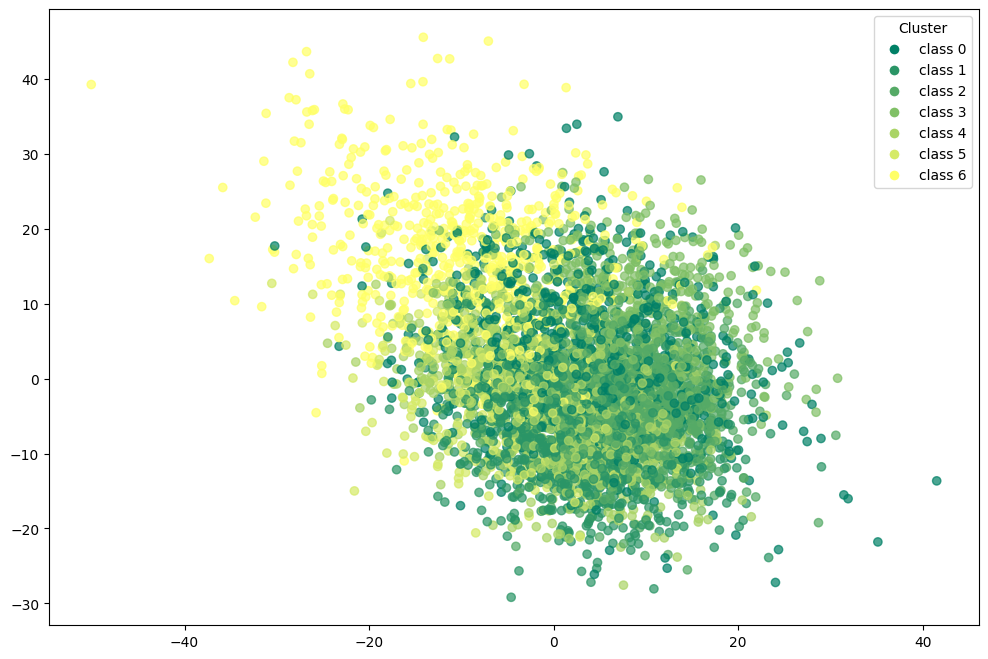

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[737  26  26  11  61  15 624]
 [  0 977  11   2   5   3   2]
 [  0   0 999   0   0   1   0]
 [  0   0   3 489   7   0   1]
 [  0   0   0   0 499   0   1]
 [  1   2   3   0   5 239   0]
 [  0   0   0   0 250   0   0]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.49      0.66      1500
           1       0.97      0.98      0.97      1000
           2       0.96      1.00      0.98      1000
           3       0.97      0.98      0.98       500
           4       0.60      1.00      0.75       500
           5       0.93      0.96      0.94       250
           6       0.00      0.00      0.00       250

    accuracy                           0.79      5000
   macro avg       0.78      0.77      0.75      5000
weighted avg       0.89      0.79      0.81      5000



In [ ]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.738738052944567

In [ ]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8234295735821159

In [ ]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.1887309366790336

### pam with t-SNE

In [ ]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [ ]:
pam_tsne.process()

In [ ]:
clusters = pam_tsne.get_clusters()

In [ ]:
medoids = pam_tsne.get_medoids()

In [ ]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_tsne = corr_dataset.copy()

In [ ]:
df_pam_tsne['pam_tsne'] = labels

In [ ]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,5.0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0.0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3.0
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,4.0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6.0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,1.0
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,4.0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,6.0


In [ ]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.1098
accuracy after: 0.7954


In [ ]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,5
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,1
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,5
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


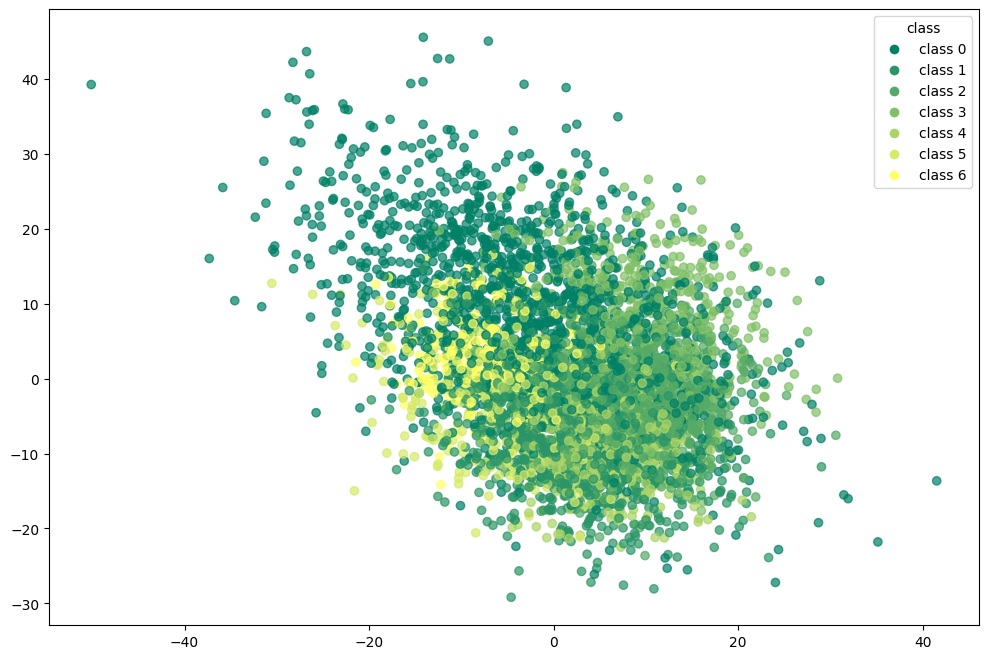

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

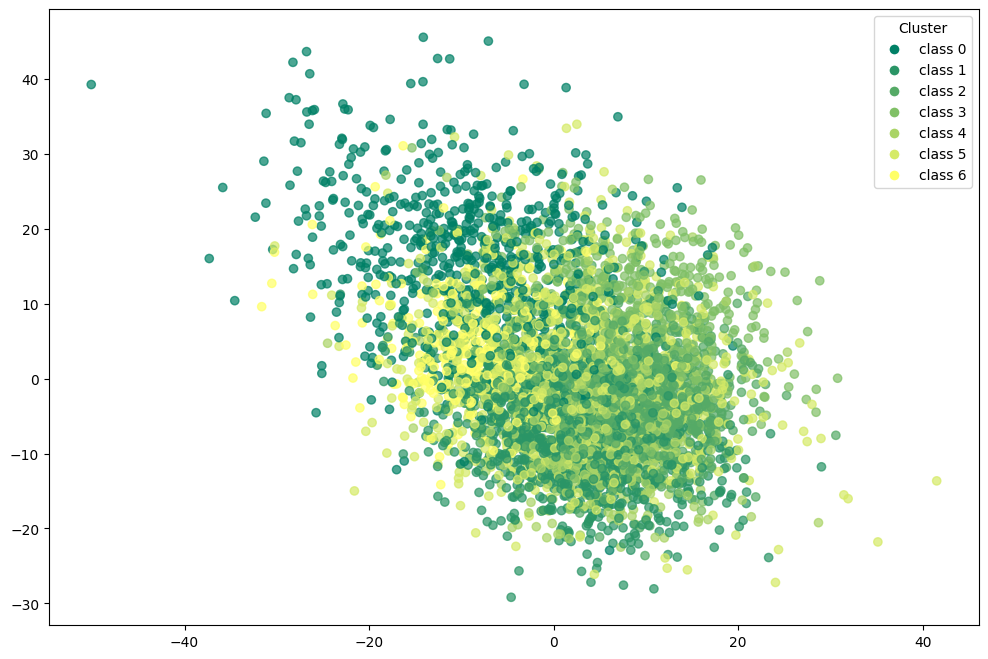

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[640  14  15  63  79 641  48]
 [ 21 965   2  12   0   0   0]
 [  0   2 974   1   0  23   0]
 [  1   0   0 499   0   0   0]
 [  1   0   0   0 499   0   0]
 [  0  49   2   0   0 150  49]
 [  0   0   0   0   0   0 250]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.97      0.43      0.59      1500
           1       0.94      0.96      0.95      1000
           2       0.98      0.97      0.98      1000
           3       0.87      1.00      0.93       500
           4       0.86      1.00      0.93       500
           5       0.18      0.60      0.28       250
           6       0.72      1.00      0.84       250

    accuracy                           0.80      5000
   macro avg       0.79      0.85      0.78      5000
weighted avg       0.89      0.80      0.80      5000



In [ ]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.6966562217994141

In [ ]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.773126692378815

In [ ]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.16543503754818759

### pam with umap

In [ ]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [ ]:
pam_umap.process()

In [ ]:
clusters = pam_umap.get_clusters()

In [ ]:
medoids = pam_umap.get_medoids()

In [ ]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_umap = corr_dataset.copy()

In [ ]:
df_pam_umap['pam_umap'] = labels

In [ ]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0.0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4.0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,6.0
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0.0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0.0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,5.0
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0.0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,3.0


In [ ]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.288
accuracy after: 0.9844


In [ ]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


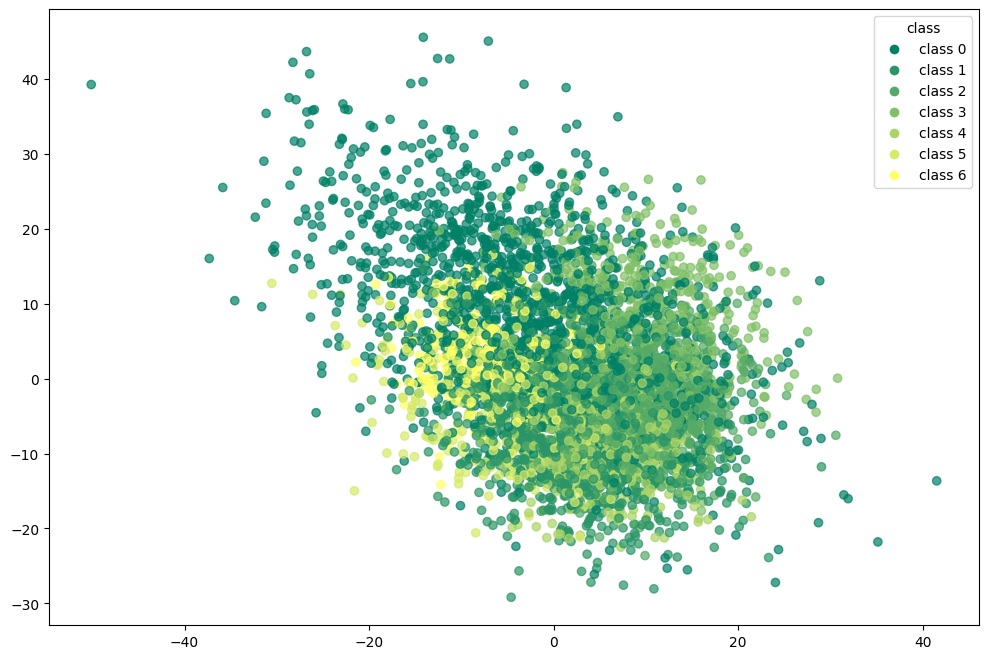

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

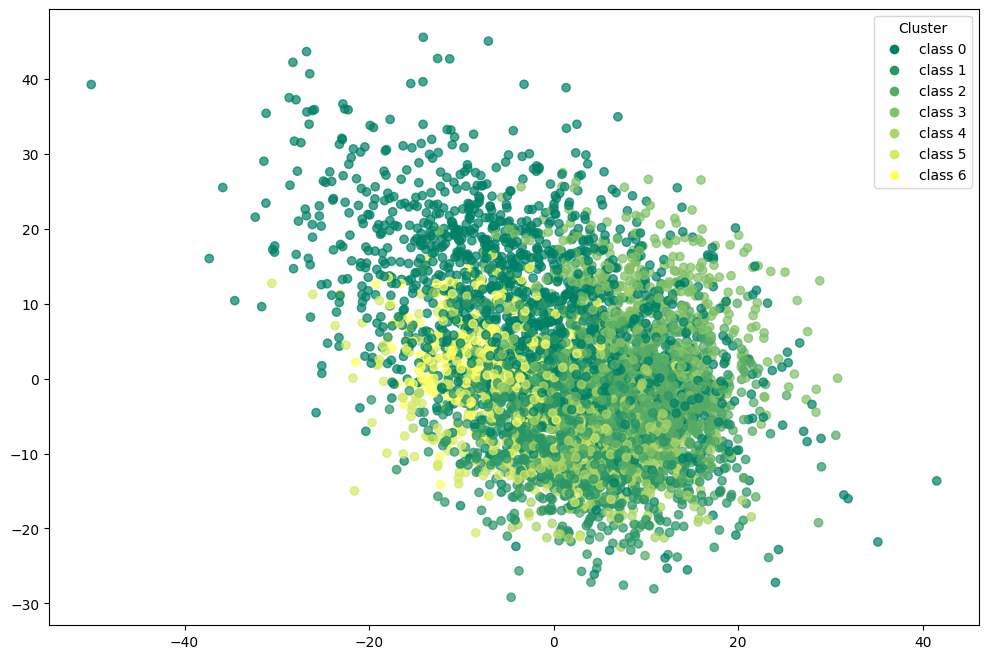

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9572453282340698

In [ ]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9514378802180793

In [ ]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.16585441023027375

## spectral clustering

In [ ]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_clustering.fit(X_values)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_spectral = corr_dataset.copy()

In [ ]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [ ]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_clustering
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,4
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,1
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,5


In [ ]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.3382
accuracy after: 0.984


In [ ]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_clustering
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,0
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


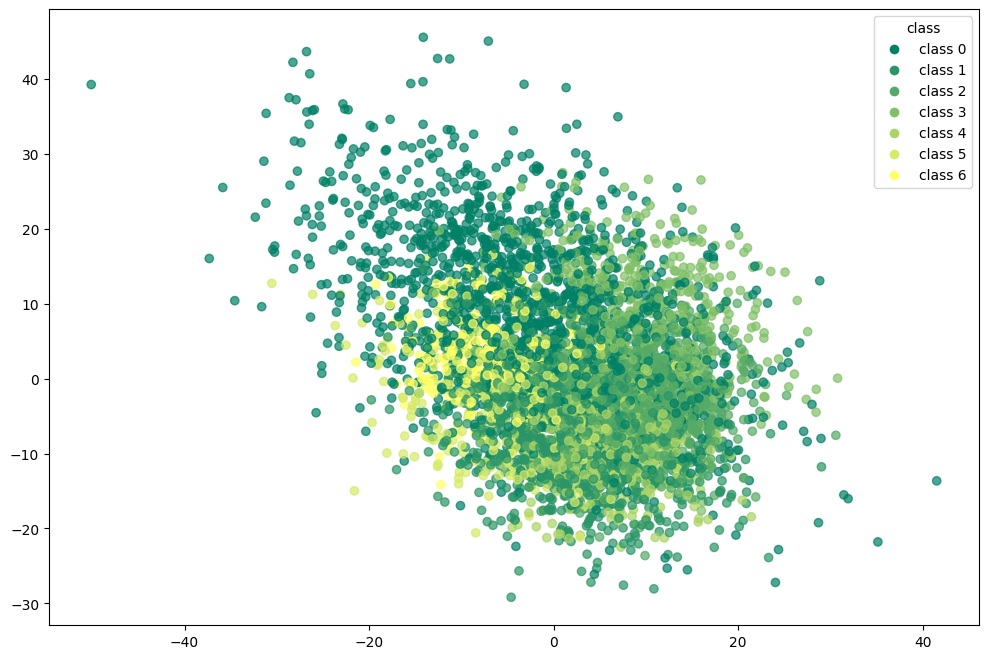

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

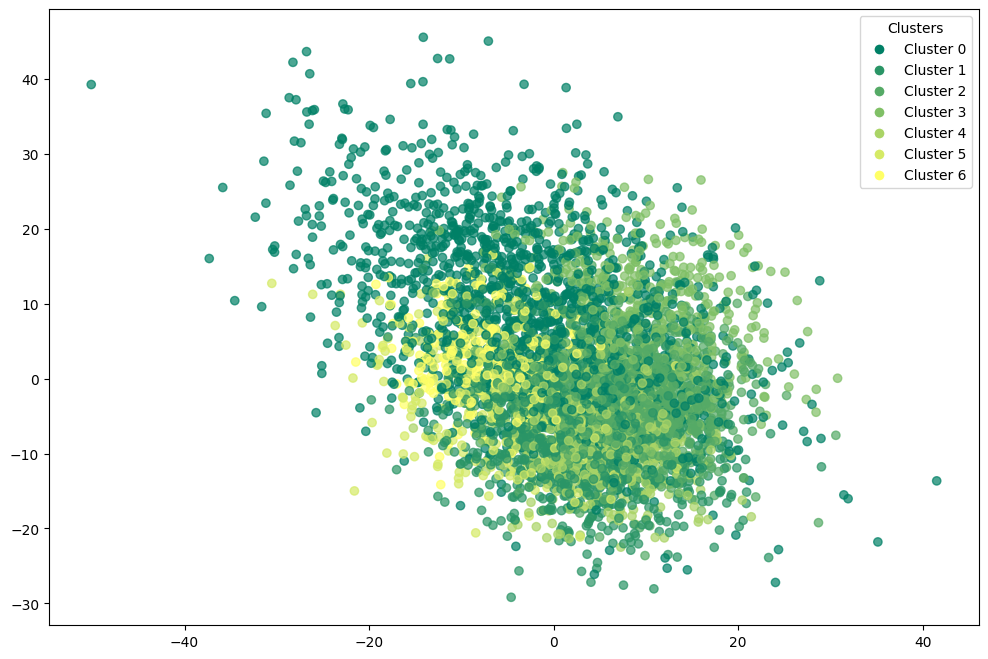

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1435   11   34    5   13    0    2]
 [   0  997    3    0    0    0    0]
 [   0    0 1000    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   3    3    2    0    0  242    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.96      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.99       500
           5       1.00      0.97      0.98       250
           6       0.99      1.00      1.00       250

    accuracy                           0.98      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9556711613307993

In [ ]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9515619574595333

In [ ]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.1661738896608884

### spectral clustering with pca

In [ ]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_pca.fit(X_pca)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_pca_spectral = corr_dataset.copy()

In [ ]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [ ]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,2
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,3
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,6
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,4
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,4
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,1
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,4
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,5


In [ ]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.0018
accuracy after: 0.8182


In [ ]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_pca
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,4
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[ 869   14   12    3   19    2  581]
 [   2  993    2    0    1    2    0]
 [   0    0 1000    0    0    0    0]
 [   2    0    0  497    1    0    0]
 [   1    1    0    0  498    0    0]
 [   0    4    2    0    8  234    2]
 [   0    0    0    0  250    0    0]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.58      0.73      1500
           1       0.98      0.99      0.99      1000
           2       0.98      1.00      0.99      1000
           3       0.99      0.99      0.99       500
           4       0.64      1.00      0.78       500
           5       0.98      0.94      0.96       250
           6       0.00      0.00      0.00       250

    accuracy                           0.82      5000
   macro avg       0.80      0.79      0.78      5000
weighted avg       0.90      0.82      0.84      5000



In [ ]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.7875455162899851

In [ ]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8707893650761247

In [ ]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.18725568396756503

### spectral clustering with t-SNE

In [ ]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_tsne.fit(X_tsne)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_tsne_spectral = corr_dataset.copy()

In [ ]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,1
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,6
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,1
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,2
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,5
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,1
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,2


In [ ]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.1018
accuracy after: 0.9758


In [ ]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_tsne
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,0
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,6
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,3
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,0
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,1
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,0
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,1


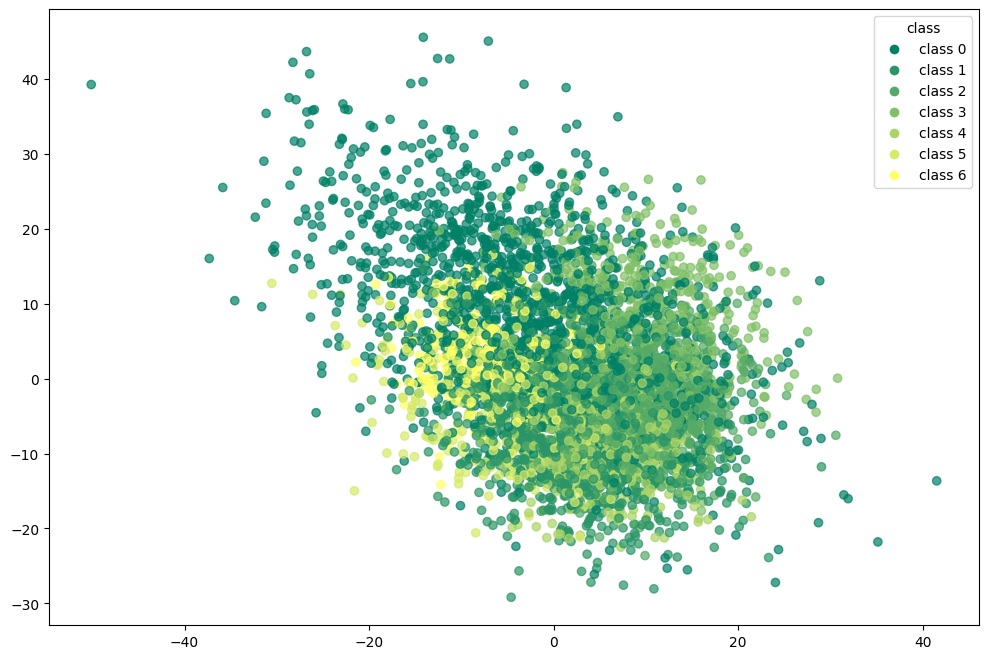

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

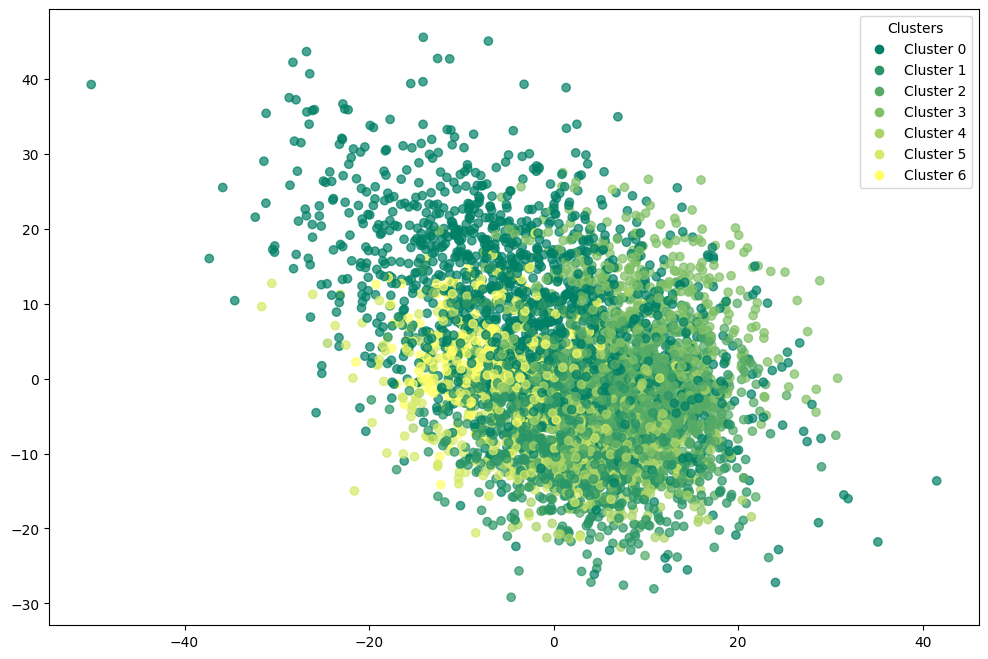

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1398   19   42    9   22    3    7]
 [   1  994    2    2    0    1    0]
 [   1    2  997    0    0    0    0]
 [   0    1    0  499    0    0    0]
 [   2    0    0    0  498    0    0]
 [   2    4    1    0    0  243    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.93      0.96      1500
           1       0.97      0.99      0.98      1000
           2       0.96      1.00      0.98      1000
           3       0.98      1.00      0.99       500
           4       0.96      1.00      0.98       500
           5       0.98      0.97      0.98       250
           6       0.97      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.97      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9337939848243563

In [ ]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9297143947329496

In [ ]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.16559137765621001

### spectral clustering with umap

In [ ]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_umap.fit(X_umap)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_umap_spectral = corr_dataset.copy()

In [ ]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [ ]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,3
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,0
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,0
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,0
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,4


In [ ]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.1732
accuracy after: 0.5696


In [ ]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_umap
0,2.997723,27.145954,8.083427,8.565770,-17.613757,-3.899437,-19.273456,21.966730,-10.674810,-10.852896,...,22.414254,0.112761,4.737969,2.257256,-4.102371,-12.898297,8.437161,-2.340858,0,3
1,-8.724694,4.015702,15.286326,-10.499812,12.334036,9.604994,8.837434,11.408665,6.705178,8.150362,...,-10.175258,-4.509197,-22.485028,-7.753005,13.428618,8.373851,-3.342272,5.171271,6,2
2,9.494166,-1.601429,-4.553333,-13.588575,-10.251530,5.404190,-5.890159,-9.194451,14.775986,-8.147931,...,10.454040,-5.262418,-1.726826,-4.665846,-3.096755,8.071958,10.394479,9.893976,3,2
3,-1.280067,11.422670,-12.506885,23.442303,1.511639,2.438824,-14.172603,-1.770284,-7.766174,8.728996,...,-11.581330,-6.614081,-24.870358,-7.736472,18.818649,14.368958,-18.828989,-18.040675,0,6
4,13.889208,-4.800704,6.162722,13.435562,-0.215327,8.500927,10.291983,-12.586298,0.381335,0.876371,...,-3.506518,-4.120990,-10.817916,5.665268,12.379552,19.214042,2.711085,-0.198968,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7.941352,-15.127328,-5.798985,-19.537833,-5.579491,5.787281,-17.596144,-0.941643,-7.239738,-0.756072,...,-13.014429,-8.812530,-14.599573,-5.576466,14.908518,4.216403,-6.381850,-9.365948,0,6
4996,3.098314,5.844505,4.980142,10.015233,-15.723249,7.578005,4.604748,-11.515748,-2.840772,10.313620,...,-6.659630,-9.213945,4.096940,-6.622237,9.202776,9.289917,3.250126,-3.940232,2,2
4997,0.825475,6.225025,-10.769342,0.686050,-4.698274,-2.484439,-8.920914,-1.018563,0.541775,17.429431,...,-11.563086,-11.856918,-22.391795,-35.773819,9.988213,20.977732,-9.886154,-6.332863,0,6
4998,4.329262,-13.416267,1.309481,1.774532,-8.995991,9.051031,-11.217279,-1.534375,3.049335,-10.059121,...,-0.509556,10.426326,-4.738047,8.444867,-2.950759,-12.628646,2.605623,-6.594708,1,4


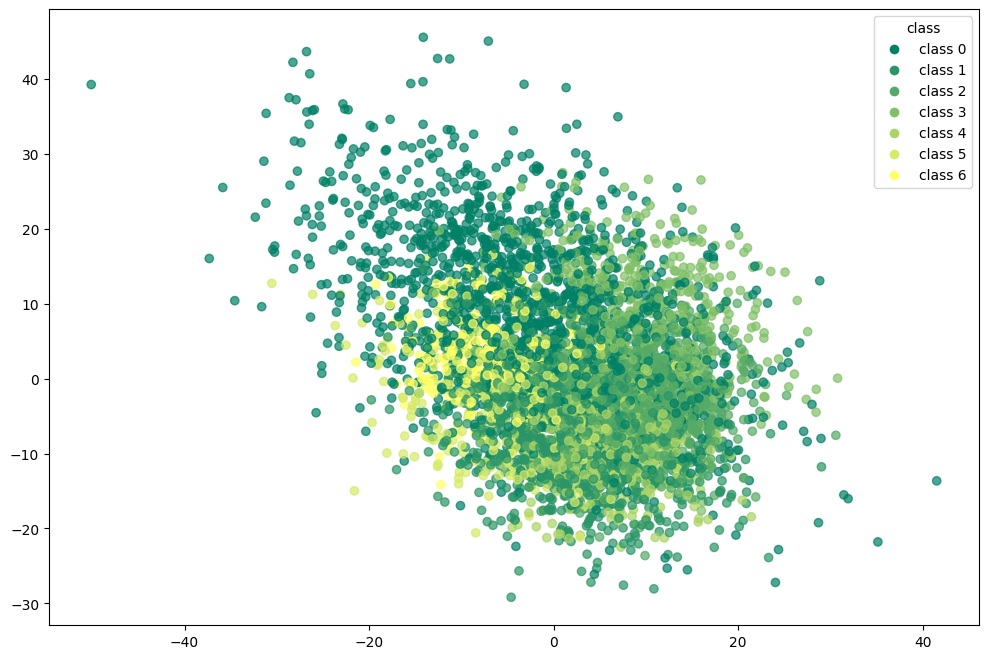

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

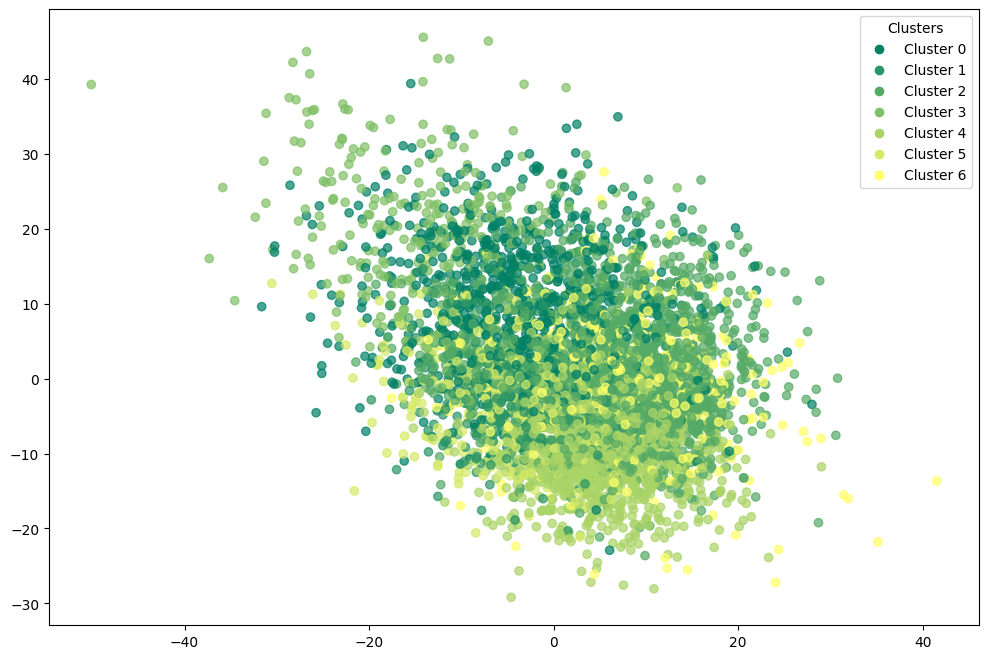

In [ ]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[774   5  34 287  24   1 375]
 [  0 332   3   0 665   0   0]
 [  0   0 999   0   1   0   0]
 [  0   2 497   0   1   0   0]
 [  1   0   0   0 499   0   0]
 [  1   0   1   0   3 244   1]
 [  0   0 250   0   0   0   0]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.52      0.68      1500
           1       0.98      0.33      0.50      1000
           2       0.56      1.00      0.72      1000
           3       0.00      0.00      0.00       500
           4       0.42      1.00      0.59       500
           5       1.00      0.98      0.99       250
           6       0.00      0.00      0.00       250

    accuracy                           0.57      5000
   macro avg       0.56      0.55      0.50      5000
weighted avg       0.70      0.57      0.55      5000



In [ ]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.45745803300350235

In [ ]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.6883656776005317

In [ ]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.09887110290675134

# accuracy and confusion matrix 

## k-means

In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66      1500
           1       0.99      0.99      0.99      1000
           2       0.97      1.00      0.99      1000
           3       0.97      0.99      0.98       500
           4       0.60      1.00      0.75       500
           5       0.95      0.98      0.97       250
           6       0.00      0.00      0.00       250

    accuracy                           0.79      5000
   macro avg       0.78      0.78      0.76      5000
weighted avg       0.90      0.79      0.81      5000



In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[ 741   15   19   13   72   10  630]
 [   2  987    7    0    1    2    1]
 [   0    0 1000    0    0    0    0]
 [   1    0    0  494    4    0    1]
 [   1    0    0    0  499    0    0]
 [   0    0    2    0    0  245    3]
 [   0    0    0    0  250    0    0]]


## k-menas + pca

In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.97      0.42      0.58      1500
           1       0.89      0.97      0.93      1000
           2       0.91      1.00      0.95      1000
           3       0.97      0.97      0.97       500
           4       0.59      1.00      0.74       500
           5       0.03      0.06      0.04       250
           6       0.00      0.00      0.00       250

    accuracy                           0.72      5000
   macro avg       0.62      0.63      0.60      5000
weighted avg       0.81      0.72      0.73      5000



In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[ 626   15   27   11   43  379  399]
 [   0  975    9    1    3   10    2]
 [   0    0 1000    0    0    0    0]
 [   0    0    1  485    7    7    0]
 [   1    0    0    0  499    0    0]
 [  17  102   62    5   46   14    4]
 [   0    0    0    0  250    0    0]]


## k-means + t-SNE

In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.95      0.39      0.55      1500
           1       0.98      0.84      0.90      1000
           2       0.98      0.95      0.96      1000
           3       0.83      1.00      0.90       500
           4       0.88      1.00      0.94       500
           5       0.54      0.99      0.70       250
           6       0.26      0.99      0.42       250

    accuracy                           0.77      5000
   macro avg       0.78      0.88      0.77      5000
weighted avg       0.89      0.77      0.78      5000



In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[586  16  14  97  65  33 689]
 [  0 841   2   7   0 150   0]
 [ 26   1 946   0   0  27   0]
 [  0   1   0 499   0   0   0]
 [  0   0   0   0 499   0   1]
 [  1   0   1   0   0 248   0]
 [  2   0   0   0   0   0 248]]


## k-means + UMAP

In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


## Birch

In [ ]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.99      0.46      0.63      1500
           1       0.99      0.99      0.99      1000
           2       1.00      1.00      1.00      1000
           3       0.99      1.00      1.00       500
           4       0.50      1.00      0.67       500
           5       0.00      0.01      0.01       250
           6       0.00      0.00      0.00       250

    accuracy                           0.74      5000
   macro avg       0.64      0.64      0.61      5000
weighted avg       0.84      0.74      0.75      5000



In [ ]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[691   4   1   2   2 410 390]
 [  3 989   3   2   1   0   2]
 [  0   2 998   0   0   0   0]
 [  0   1   0 499   0   0   0]
 [  1   0   1   0 498   0   0]
 [  2   2   0   0 244   2   0]
 [  1   0   0   0 248   1   0]]


## Birch + pca

In [ ]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.92      0.43      0.59      1500
           1       0.59      0.70      0.64      1000
           2       0.44      0.98      0.60      1000
           3       0.00      0.00      0.00       500
           4       0.01      0.01      0.01       500
           5       0.01      0.02      0.01       250
           6       0.00      0.00      0.00       250

    accuracy                           0.47      5000
   macro avg       0.28      0.31      0.27      5000
weighted avg       0.48      0.47      0.43      5000



In [ ]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[651   8  18  78 437 293  15]
 [  8 705 271   0  14   2   0]
 [ 13   4 982   0   1   0   0]
 [ 16 468  15   0   1   0   0]
 [ 17   1 479   0   3   0   0]
 [  0   2 244   0   0   4   0]
 [  1   0 245   0   0   4   0]]


## Birch + t-SNE

In [ ]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.98      0.59      0.74      1500
           1       0.98      0.98      0.98      1000
           2       0.95      1.00      0.97      1000
           3       0.98      0.99      0.99       500
           4       0.97      0.92      0.94       500
           5       0.00      0.01      0.01       250
           6       0.49      1.00      0.66       250

    accuracy                           0.81      5000
   macro avg       0.76      0.78      0.75      5000
weighted avg       0.90      0.81      0.84      5000



In [ ]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[890  13  48   8  16 506  19]
 [ 17 980   2   0   0   0   1]
 [  0   2 996   0   0   2   0]
 [  1   3   0 496   0   0   0]
 [  2   0   0   0 458  40   0]
 [  1   4   1   0   0   2 242]
 [  0   0   0   0   0   0 250]]


## Birch + UMAP

In [ ]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


## GMM

In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      0.83      0.91      1000
           2       1.00      1.00      1.00      1000
           3       1.00      0.97      0.98       500
           4       0.67      1.00      0.80       500
           5       1.00      0.99      1.00       250
           6       0.00      0.00      0.00       250

    accuracy                           0.91      5000
   macro avg       0.81      0.83      0.81      5000
weighted avg       0.92      0.91      0.91      5000



In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1499    0    0    0    0    0    1]
 [   2  833    0    0    0    0  165]
 [   0    0 1000    0    0    0    0]
 [   1    0    0  483    0    0   16]
 [   2    0    0    0  498    0    0]
 [   0    0    0    0    0  248    2]
 [   0    0    0    0  250    0    0]]


## GMM + pca

In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66      1500
           1       0.99      0.99      0.99      1000
           2       1.00      1.00      1.00      1000
           3       1.00      0.94      0.97       500
           4       0.49      1.00      0.66       500
           5       0.00      0.00      0.00       250
           6       0.00      0.00      0.00       250

    accuracy                           0.74      5000
   macro avg       0.64      0.63      0.61      5000
weighted avg       0.84      0.74      0.76      5000



In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[740   7   3   1  15 685  49]
 [  0 991   1   0   7   1   0]
 [  0   1 997   0   2   0   0]
 [  0   1   0 468   0   0  31]
 [  1   0   0   0 498   1   0]
 [  4   3   0   0 243   0   0]
 [  0   0   0   0 250   0   0]]


## GMM + t-SNE

In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.99      0.82      0.90      1500
           1       0.98      1.00      0.99      1000
           2       0.97      0.99      0.98      1000
           3       0.99      1.00      0.99       500
           4       0.96      0.99      0.98       500
           5       0.98      0.97      0.98       250
           6       0.55      1.00      0.71       250

    accuracy                           0.94      5000
   macro avg       0.92      0.97      0.93      5000
weighted avg       0.96      0.94      0.94      5000



In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1227   17   26    7   19    3  201]
 [   1  996    2    0    0    1    0]
 [   4    2  994    0    0    0    0]
 [   0    2    0  498    0    0    0]
 [   3    0    0    0  497    0    0]
 [   3    4    1    0    0  242    0]
 [   0    0    0    0    0    0  250]]


## GMM + UMAP

In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


## PAM

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[543  31  71 147  65 541 102]
 [  3 965  14   5   0   6   7]
 [  0   0 999   0   0   0   1]
 [  2  13   5 465   1   0  14]
 [  0   0   0   0 500   0   0]
 [  3  49  48  53  14   3  80]
 [  0   0   0   0   0   0 250]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.99      0.36      0.53      1500
           1       0.91      0.96      0.94      1000
           2       0.88      1.00      0.93      1000
           3       0.69      0.93      0.79       500
           4       0.86      1.00      0.93       500
           5       0.01      0.01      0.01       250
           6       0.55      1.00      0.71       250

    accuracy                           0.74      5000
   macro avg       0.70      0.75      0.69      5000
weighted avg       0.84      0.74      0.74      5000



## PAM + pca

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[737  26  26  11  61  15 624]
 [  0 977  11   2   5   3   2]
 [  0   0 999   0   0   1   0]
 [  0   0   3 489   7   0   1]
 [  0   0   0   0 499   0   1]
 [  1   2   3   0   5 239   0]
 [  0   0   0   0 250   0   0]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.49      0.66      1500
           1       0.97      0.98      0.97      1000
           2       0.96      1.00      0.98      1000
           3       0.97      0.98      0.98       500
           4       0.60      1.00      0.75       500
           5       0.93      0.96      0.94       250
           6       0.00      0.00      0.00       250

    accuracy                           0.79      5000
   macro avg       0.78      0.77      0.75      5000
weighted avg       0.89      0.79      0.81      5000



## PAM + t-SNE

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[640  14  15  63  79 641  48]
 [ 21 965   2  12   0   0   0]
 [  0   2 974   1   0  23   0]
 [  1   0   0 499   0   0   0]
 [  1   0   0   0 499   0   0]
 [  0  49   2   0   0 150  49]
 [  0   0   0   0   0   0 250]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.97      0.43      0.59      1500
           1       0.94      0.96      0.95      1000
           2       0.98      0.97      0.98      1000
           3       0.87      1.00      0.93       500
           4       0.86      1.00      0.93       500
           5       0.18      0.60      0.28       250
           6       0.72      1.00      0.84       250

    accuracy                           0.80      5000
   macro avg       0.79      0.85      0.78      5000
weighted avg       0.89      0.80      0.80      5000



## PAM + umap

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1436   13   26    5   16    1    3]
 [   0  997    3    0    0    0    0]
 [   0    1  999    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   2    3    1    0    0  244    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.97      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.98       500
           5       1.00      0.98      0.99       250
           6       0.99      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.98      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



## spectral clustering

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1435   11   34    5   13    0    2]
 [   0  997    3    0    0    0    0]
 [   0    0 1000    0    0    0    0]
 [   0    3    0  497    0    0    0]
 [   1    0    0    0  499    0    0]
 [   3    3    2    0    0  242    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      1500
           1       0.98      1.00      0.99      1000
           2       0.96      1.00      0.98      1000
           3       0.99      0.99      0.99       500
           4       0.97      1.00      0.99       500
           5       1.00      0.97      0.98       250
           6       0.99      1.00      1.00       250

    accuracy                           0.98      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.98      0.98      0.98      5000



## spectral clustering + pca

In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[ 869   14   12    3   19    2  581]
 [   2  993    2    0    1    2    0]
 [   0    0 1000    0    0    0    0]
 [   2    0    0  497    1    0    0]
 [   1    1    0    0  498    0    0]
 [   0    4    2    0    8  234    2]
 [   0    0    0    0  250    0    0]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.58      0.73      1500
           1       0.98      0.99      0.99      1000
           2       0.98      1.00      0.99      1000
           3       0.99      0.99      0.99       500
           4       0.64      1.00      0.78       500
           5       0.98      0.94      0.96       250
           6       0.00      0.00      0.00       250

    accuracy                           0.82      5000
   macro avg       0.80      0.79      0.78      5000
weighted avg       0.90      0.82      0.84      5000



## spectral clustering + t-SNE

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1398   19   42    9   22    3    7]
 [   1  994    2    2    0    1    0]
 [   1    2  997    0    0    0    0]
 [   0    1    0  499    0    0    0]
 [   2    0    0    0  498    0    0]
 [   2    4    1    0    0  243    0]
 [   0    0    0    0    0    0  250]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.93      0.96      1500
           1       0.97      0.99      0.98      1000
           2       0.96      1.00      0.98      1000
           3       0.98      1.00      0.99       500
           4       0.96      1.00      0.98       500
           5       0.98      0.97      0.98       250
           6       0.97      1.00      0.99       250

    accuracy                           0.98      5000
   macro avg       0.97      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



## spectral clustering + umap

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[774   5  34 287  24   1 375]
 [  0 332   3   0 665   0   0]
 [  0   0 999   0   1   0   0]
 [  0   2 497   0   1   0   0]
 [  1   0   0   0 499   0   0]
 [  1   0   1   0   3 244   1]
 [  0   0 250   0   0   0   0]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      0.52      0.68      1500
           1       0.98      0.33      0.50      1000
           2       0.56      1.00      0.72      1000
           3       0.00      0.00      0.00       500
           4       0.42      1.00      0.59       500
           5       1.00      0.98      0.99       250
           6       0.00      0.00      0.00       250

    accuracy                           0.57      5000
   macro avg       0.56      0.55      0.50      5000
weighted avg       0.70      0.57      0.55      5000



# external measures  

## k-means

In [ ]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.752
NMI: 0.842
Silhouette: 0.191


## k-means + pca

In [ ]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.652
NMI: 0.743
Silhouette: 0.181


## k-means + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.649
NMI: 0.758
Silhouette: 0.144


## k-means + umap

In [ ]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.957
NMI: 0.951
Silhouette: 0.166


##  Birch 

In [ ]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.707
NMI: 0.832
Silhouette: 0.172


## Birch + pca

In [ ]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.297
NMI: 0.515
Silhouette: 0.106


## Birch + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.769
NMI: 0.837
Silhouette: 0.171


## Birch + umap

In [ ]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.957
NMI: 0.951
Silhouette: 0.166


## GMM

In [ ]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.927
NMI: 0.934
Silhouette: 0.125


## GMM + pca

In [ ]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.733
NMI: 0.833
Silhouette: 0.158


## GMM + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.868
NMI: 0.893
Silhouette: 0.159


## GMM + umap

In [ ]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.957
NMI: 0.951
Silhouette: 0.166


## pam

In [ ]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.634
NMI: 0.701
Silhouette: 0.174


## pam + pca

In [ ]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.739
NMI: 0.823
Silhouette: 0.189


## pam + tsne

In [ ]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.697
NMI: 0.773
Silhouette: 0.165


## pca + umap

In [ ]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.957
NMI: 0.951
Silhouette: 0.166


## spectral clustering

In [ ]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.956
NMI: 0.952
Silhouette: 0.166


## spectral clustering + pca

In [ ]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.788
NMI: 0.871
Silhouette: 0.187


## spectral clustering + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.934
NMI: 0.930
Silhouette: 0.166


## spectral clustering + umap

In [ ]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.457
NMI: 0.688
Silhouette: 0.099


# final output

In [ ]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.752  0.842       0.191
k-means + pca               0.652  0.743       0.181
k-means + tsne              0.649  0.758       0.144
k-means + umap              0.957  0.951       0.166
Birch                       0.707  0.832       0.172
Birch + pca                 0.297  0.515       0.106
Birch + tsne                0.769  0.837       0.171
Birch + umap                0.957  0.951       0.166
GMM                         0.927  0.934       0.125
GMM + pca                   0.733  0.833       0.158
GMM + tsne                  0.868  0.893       0.159
GMM + umap                  0.957  0.951       0.166
PAM                         0.634  0.701       0.174
PAM + pca                   0.739  0.823       0.189
PAM + tsne                  0.697  0.773       0.165
PAM + umap                  0.957  0.951       0.166
Spectral Clustering         0.956  0.952       0.166
Spectral Clustering + pca   0.788  0.871      

In [ ]:
if N_SAMPLE == 5000 and N_FEATURES == 20:
    folder = "5000_20"
elif N_SAMPLE == 10000 and N_FEATURES == 10:
    folder = "10000_10"
elif N_SAMPLE == 20000 and N_FEATURES == 5:
    folder = "20000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_15.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_15.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_15.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
dfs = {}

In [ ]:
dfs[f"df_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 20'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 15'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 10'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 20'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 15'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 10'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 20'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 15'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 10'):df_7_cluster['ARI'].values,
        }
)

## final dataset

In [ ]:
dfs[f"df_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
dfs[f"df_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"df_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
df_5000_20 = pd.read_csv("df_5000_20.csv", header=[0,1,2])

In [ ]:
df_5000_20.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])